# **Loading Libraries**

In [1]:
import os
import zipfile
import matplotlib.pyplot as plt
import shutil
from PIL import Image, UnidentifiedImageError
import seaborn as sns
import numpy as np
import pandas as pd
import hashlib
import warnings
import cv2
import random
import tensorflow as tf
import matplotlib.image as mpimg
from IPython.core.magic import register_cell_magic
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Suppress the FutureWarnings from seaborn
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

@register_cell_magic
def skip(line, cell):
    return

In [2]:
%%skip
!pip install tensorflow==2.15.0

In [3]:
%%skip
# skip this please
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Unzipping and Loading Dataset**

In [4]:
# Path to your zip file in Google Drive
zip_file_path = '/content/drive/MyDrive/Dissertation/CCMT_Dataset.zip' #Please update this with the file path
unzip_path = '/content/CCMT_unzipped_data'

In [5]:
# Unzipping the dataset
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(unzip_path)

print("Dataset unzipped successfully!")

Dataset unzipped successfully!


# **Pre-Processing**

### Cleaning Data & EDA

In [6]:
# Specify the source and target directories
source_dir = '/content/CCMT_unzipped_data/CCMT Dataset'
main_dir = '/content/CCMT_crop_diseases'

In [7]:
removed_count = 0

# Walk through all files in the directory
for subdir, dirs, files in os.walk(source_dir):
    for file in files:
        filepath = os.path.join(subdir, file)
        try:
            # Attempt to open and convert the image to RGB to ensure it's not corrupted
            with Image.open(filepath) as img:
                img.convert('RGB')  # Convert to RGB to force loading the whole image
        except Exception:
            os.remove(filepath)  # Remove the corrupted file
            removed_count += 1

print(f"Removed {removed_count} corrupted images from {source_dir}")

Removed 95 corrupted images from /content/CCMT_unzipped_data/CCMT Dataset


In [8]:
# Function to reorganize the dataset
def reorganize_dataset(src_dir, diseases_dir):
    # Create the diseases directory if it doesn't exist
    os.makedirs(diseases_dir, exist_ok=True)

    # Verify that the source directory exists
    if not os.path.exists(src_dir):
        raise FileNotFoundError(f"Source directory {src_dir} does not exist.")

    # Crop to disease mapping, excluding pest-related classes
    crop_disease_mapping = {
        'Cashew': ['anthracnose', 'healthy', 'red rust'],
        'Cassava': ['bacterial blight', 'brown spot', 'healthy', 'mosaic'],
        'Maize': ['leaf blight', 'leaf spot', 'streak virus', 'healthy'],
        'Tomato': ['leaf blight', 'septoria leaf spot', 'verticulium wilt', 'healthy']
    }

    # Reorganize files into the diseases directory
    for crop, diseases in crop_disease_mapping.items():
        for disease in diseases:
            src_disease_dir = os.path.join(src_dir, crop, disease)
            if not os.path.exists(src_disease_dir):
                continue  # Skip missing directories

            dest_disease_dir = os.path.join(diseases_dir, f"{crop}_{disease}")
            os.makedirs(dest_disease_dir, exist_ok=True)

            # Copy files from source to destination directories
            for filename in os.listdir(src_disease_dir):
                src_file = os.path.join(src_disease_dir, filename)
                if not filename.startswith('._'):  # Skip unwanted files
                    try:
                        shutil.copy(src_file, os.path.join(dest_disease_dir, filename))
                    except Exception as e:
                        print(f"Error copying file {src_file}: {e}")

    print("Reorganization complete.")

# Function to count images in directories
def count_images_in_directory(directory):
    total_images = 0
    for root, dirs, files in os.walk(directory):
        image_count = len([file for file in files if not file.startswith('._')])
        total_images += image_count
    return total_images

# Reorganize the dataset
reorganize_dataset(source_dir, main_dir)

# Count images in the source and diseases directories
print(f"Total images in diseases directory: {count_images_in_directory(main_dir)}")

Reorganization complete.
Total images in diseases directory: 19939


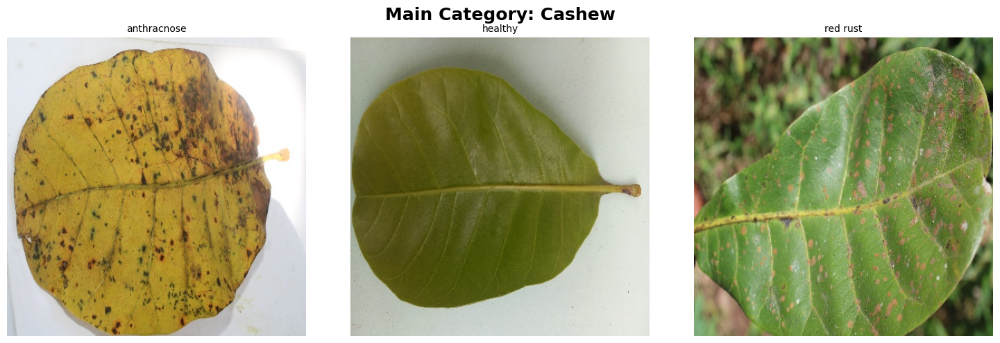

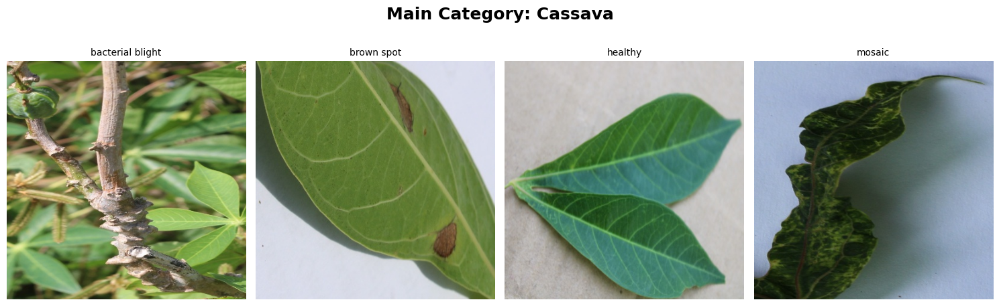

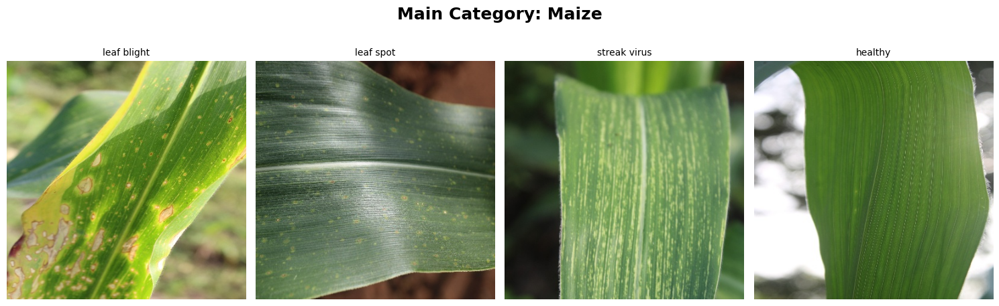

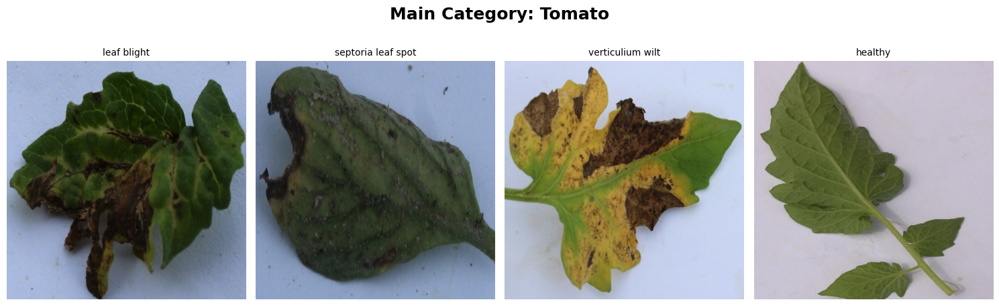

In [9]:
# Define subcategories for each main category
subcategories = {
    'Cashew': ['anthracnose', 'healthy', 'red rust'],
    'Cassava': ['bacterial blight', 'brown spot', 'healthy', 'mosaic'],
    'Maize': ['leaf blight', 'leaf spot', 'streak virus', 'healthy'],
    'Tomato': ['leaf blight', 'septoria leaf spot', 'verticulium wilt', 'healthy']
}

# Function to visualize samples from each subcategory within the main category
def visualize_samples_by_category(subcategories, base_dir, samples_per_subcategory=1):
    for main_category, subcategory_list in subcategories.items():
        fig, axes = plt.subplots(1, len(subcategory_list), figsize=(15, 5))

        for i, subcategory in enumerate(subcategory_list):
            # Construct the path to the subcategory directory
            subcategory_path = os.path.join(base_dir, f"{main_category}_{subcategory}")

            # List all files in the subcategory directory
            files_in_subcategory = [f for f in os.listdir(subcategory_path) if not f.startswith('._') and f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if len(files_in_subcategory) == 0:
                print(f"No images found in subcategory {subcategory} of {main_category}.")
                continue

            # Randomly select an image from the subcategory
            image_filename = random.choice(files_in_subcategory)

            # Create the full path to the image
            image_path = os.path.join(subcategory_path, image_filename)

            # Read and display the image using Matplotlib
            img = mpimg.imread(image_path)

            # Display the image in the current subplot
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f'{subcategory}', fontsize=10)

        # Set overall title for the main category
        fig.suptitle(f'Main Category: {main_category}', fontsize=18, fontweight='bold')

        plt.tight_layout()
        plt.show()

# Run the visualization function
visualize_samples_by_category(subcategories, main_dir)

In [10]:
# Function to get image dimensions
def get_image_dimensions(directory):
    image_dimensions = []
    for subdir, _, files in os.walk(directory):
        for file in files:
            img_path = os.path.join(subdir, file)
            try:
                with Image.open(img_path) as img:
                    image_dimensions.append(img.size)
            except (UnidentifiedImageError, OSError):
                continue
    return image_dimensions

# Get the dimensions before resizing
before_resize_dimensions = get_image_dimensions(main_dir)

# Convert to DataFrame for analysis
before_resize_df = pd.DataFrame(before_resize_dimensions, columns=['Width', 'Height'])
before_resize_df['AspectRatio'] = before_resize_df['Width'] / before_resize_df['Height']


In [11]:
# Function to resize images
def resize_images(directory, size=(224, 224)):
    resized_count = 0
    for subdir, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(subdir, file)
            try:
                with Image.open(file_path) as img:
                    img_resized = img.resize(size)
                    img_resized.save(file_path)
                    resized_count += 1
            except (UnidentifiedImageError, OSError):
                continue
    return resized_count

# Resize all images
resized_images_count = resize_images(main_dir)

print(f"All images have been resized to the standard size.")
print(f"Total resized images: {resized_images_count}")

All images have been resized to the standard size.
Total resized images: 19939


In [12]:
# Get the dimensions after resizing
after_resize_dimensions = get_image_dimensions(main_dir)

# Convert to DataFrame for analysis
after_resize_df = pd.DataFrame(after_resize_dimensions, columns=['Width', 'Height'])
after_resize_df['AspectRatio'] = after_resize_df['Width'] / after_resize_df['Height']

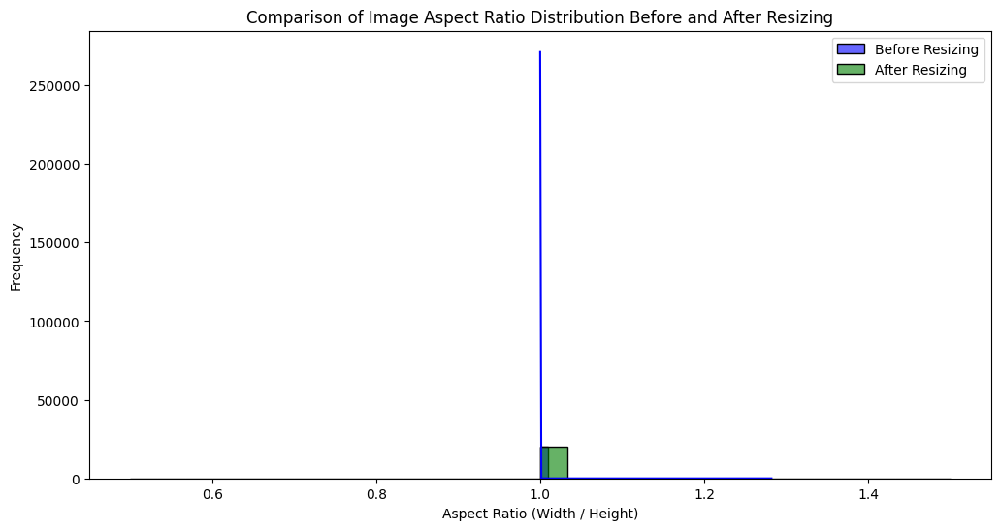

In [13]:
# Combined histograms for before and after resizing
plt.figure(figsize=(12, 6))

# Histogram before resizing
sns.histplot(before_resize_df['AspectRatio'], bins=30, kde=True, color='blue', label='Before Resizing', alpha=0.6)

# Histogram after resizing
sns.histplot(after_resize_df['AspectRatio'], bins=30, kde=True, color='green', label='After Resizing', alpha=0.6)

plt.xlabel('Aspect Ratio (Width / Height)')
plt.ylabel('Frequency')
plt.title('Comparison of Image Aspect Ratio Distribution Before and After Resizing')
plt.legend()
plt.show()


Analyzing Class Distribution...


<ipython-input-15-d6e0bf9e7728>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='Class', y='Number of Images', palette='viridis')


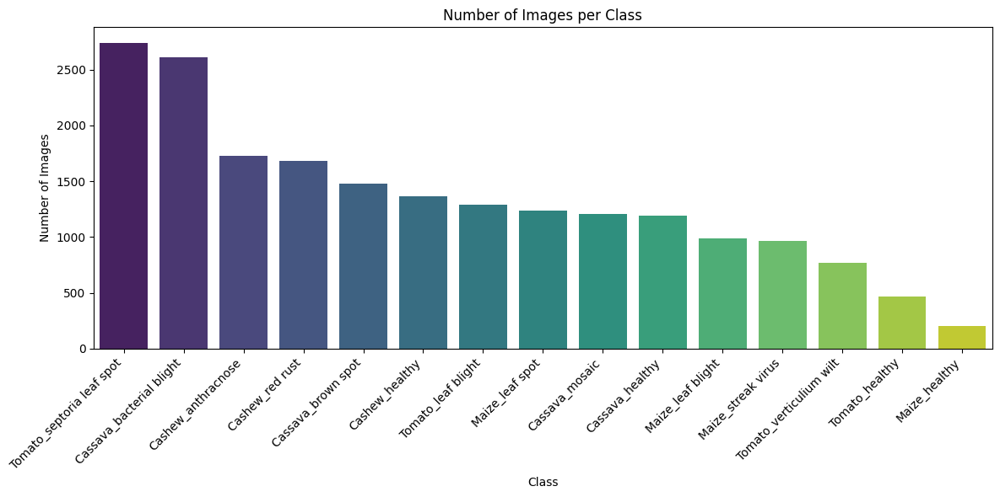

In [15]:
# 1. Class Distribution
def plot_class_distribution(diseases_dir):
    class_counts = {}

    for class_dir in os.listdir(diseases_dir):
        class_path = os.path.join(diseases_dir, class_dir)
        if os.path.isdir(class_path):
            num_images = len([file for file in os.listdir(class_path) if not file.startswith('._') and file.lower().endswith(('.png', '.jpg', '.jpeg'))])
            class_counts[class_dir] = num_images

    # Convert to DataFrame for easier plotting
    df = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Number of Images'])
    df = df.sort_values(by='Number of Images', ascending=False)

    plt.figure(figsize=(12,6))
    sns.barplot(data=df, x='Class', y='Number of Images', palette='viridis')
    plt.xticks(rotation=45, ha='right')
    plt.title('Number of Images per Class')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.tight_layout()
    plt.show()

print("Analyzing Class Distribution...")
plot_class_distribution(main_dir)

# **Machine Learning**

In [18]:
from tensorflow.keras.applications import InceptionResNetV2, Xception, VGG16, ResNet152V2, EfficientNetB6, DenseNet201, NASNetLarge, EfficientNetV2L, ConvNeXtXLarge
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.preprocessing import image
from sklearn.utils import class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Precision, Recall

In [19]:
# Function to split dataset into train, validation, and test directories
def split_dataset(source_dir, train_dir, val_dir, test_dir, train_split=0.6, val_split=0.2, test_split=0.2):
    assert train_split + val_split + test_split == 1, "Split ratios must sum to 1"
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    for category in os.listdir(source_dir):
        category_path = os.path.join(source_dir, category)
        if os.path.isdir(category_path):
            files = os.listdir(category_path)
            np.random.shuffle(files)
            train_cutoff = int(train_split * len(files))
            val_cutoff = int((train_split + val_split) * len(files))
            file_paths = [os.path.join(category_path, file) for file in files]
            train_files, val_files, test_files = file_paths[:train_cutoff], file_paths[train_cutoff:val_cutoff], file_paths[val_cutoff:]
            for dest_dir, file_list in zip([train_dir, val_dir, test_dir], [train_files, val_files, test_files]):
                dest_category_dir = os.path.join(dest_dir, category)
                os.makedirs(dest_category_dir, exist_ok=True)
                for file in file_list:
                    shutil.copy(file, dest_category_dir)

# Define directories for train, val, and test datasets
train_dir = '/content/CCMT_diseases_train'
val_dir = '/content/CCMT_diseases_val'
test_dir = '/content/CCMT_diseases_test'

# Split the dataset into train, validation, and test directories
split_dataset(main_dir, train_dir, val_dir, test_dir)

In [20]:
# Recreate the data generators with more controlled settings
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators with shuffled data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True  # Ensure data is shuffled properly
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True  # Ensure validation data is shuffled
)


test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Define a custom F1-score metric
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision = Precision()
        self.recall = Recall()

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision.update_state(y_true, y_pred, sample_weight)
        self.recall.update_state(y_true, y_pred, sample_weight)

    def result(self):
        precision = self.precision.result()
        recall = self.recall.result()
        return 2 * ((precision * recall) / (precision + recall + tf.keras.backend.epsilon()))

    def reset_states(self):
        self.precision.reset_states()
        self.recall.reset_states()

# Adding debug print statements
print(f"Training samples: {train_generator.samples}")
print(f"Validation samples: {val_generator.samples}")
print(f"Test samples: {test_generator.samples}")

# Compute class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(train_generator.classes), y=train_generator.classes)
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}
print(f"Class weights: {class_weights_dict}")


Found 11957 images belonging to 15 classes.
Found 3989 images belonging to 15 classes.
Found 3993 images belonging to 15 classes.
Training samples: 11957
Validation samples: 3989
Test samples: 3993
Class weights: {0: 0.7686917389906782, 1: 0.9721138211382114, 2: 0.7900231252064751, 3: 0.5083758503401361, 4: 0.8976726726726727, 5: 1.1148717948717948, 6: 1.1025357307514985, 7: 6.533879781420765, 8: 1.3419753086419752, 9: 1.0728577837595334, 10: 1.376741508347726, 11: 2.8571087216248507, 12: 1.0325561312607945, 13: 0.4845795339412361, 14: 1.7216702663786898}


### **Using Xception**

In [21]:
# Define the model
base_model_xception = Xception(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_xception.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_xception.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output_xception = Dense(train_generator.num_classes, activation='softmax', name='crop_output_xception')(x)

# Compile the model
model_xception = Model(inputs=base_model_xception.input, outputs=crop_output_xception)
model_xception.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()]
)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
# Train the model
history_xception = model_xception.fit(
    train_generator,
    epochs=30,
    validation_data = val_generator,
    steps_per_epoch = train_generator.samples // train_generator.batch_size,
    validation_steps = val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - ETA: 0s - loss: 1.2305 - accuracy: 0.5784 - precision: 0.6362 - recall: 0.5187 - f1score: 0.5714

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:2723: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


373/373 [==============================] - 190s 475ms/step - loss: 1.2305 - accuracy: 0.5784 - precision: 0.6362 - recall: 0.5187 - f1score: 0.5714 - val_loss: 0.9503 - val_accuracy: 0.6714 - val_precision: 0.7203 - val_recall: 0.6164 - val_f1score: 0.6643 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 177s 476ms/step - loss: 0.8864 - accuracy: 0.6493 - precision: 0.7023 - recall: 0.5861 - f1score: 0.6389 - val_loss: 0.7710 - val_accuracy: 0.6930 - val_precision: 0.7371 - val_recall: 0.6502 - val_f1score: 0.6909 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 176s 471ms/step - loss: 0.7815 - accuracy: 0.6745 - precision: 0.7262 - recall: 0.6140 - f1score: 0.6654 - val_loss: 1.0657 - val_accuracy: 0.6217 - val_precision: 0.6538 - val_recall: 0.5877 - val_f1score: 0.6190 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 180s 483ms/step - loss: 0.7601 - accuracy: 0.6779 - precision: 0.7341 - recall: 0.6183 - f1score: 0.6712 - val_los

In [ ]:
# Evaluate the Xception model on the test set
test_loss_xception, test_accuracy_xception, test_precision_xception, test_recall_xception, test_f1score_xception = model_xception.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for Xception
print(f"Xception - Test Loss: {test_loss_xception:.2f}")
print(f"Xception - Test Accuracy: {test_accuracy_xception:.2f}")
print(f"Xception - Test Precision: {test_precision_xception:.2f}")
print(f"Xception - Test Recall: {test_recall_xception:.2f}")
print(f"Xception - Test F1 Score: {test_f1score_xception:.2f}")

124/124 [==============================] - 20s 157ms/step - loss: 0.4915 - accuracy: 0.8105 - precision: 0.8344 - recall: 0.7744 - f1score: 0.8033
Xception - Test Loss: 0.49
Xception - Test Accuracy: 0.81
Xception - Test Precision: 0.83
Xception - Test Recall: 0.77
Xception - Test F1 Score: 0.80


In [ ]:
# prompt: i want to save the above model
model_xception.save('/content/drive/MyDrive/Dissertation/Trained_Models/Xception_model_main.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


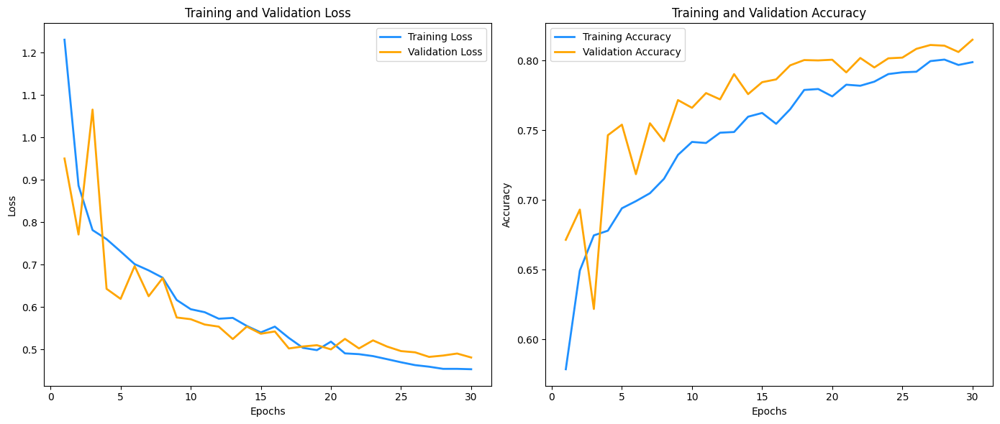

In [ ]:
# Extract history data
history_dict_xception = history_xception.history
epochs = range(1, len(history_dict_xception['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_xception['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_xception['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_xception['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_xception['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
# Function to load and preprocess the image
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))  # Load the image and resize it
    img_array = image.img_to_array(img)  # Convert the image to an array
    img_array = np.expand_dims(img_array, axis=0)  # Add a batch dimension
    img_processed = preprocess_input(img_array)  # Use the appropriate preprocessing
    return img_processed

In [ ]:
# Path to your trained model
model_path = '/content/drive/MyDrive/Dissertation/Trained_Models/Xception_model_main.h5'  # Adjust the path as necessary
model_trained = load_model(model_path)

In [ ]:
img_path = '/content/healthy-tomato-leaf.jpg'  # Adjust the path to your new image
processed_image = load_and_preprocess_image(img_path)

simple_prediction = model_trained.predict(processed_image)
predicted_class_index = np.argmax(simple_prediction, axis=1)  # Get the index of the highest probability class

class_labels = {index: label for label, index in train_generator.class_indices.items()}  # Based on your training data
predicted_class_label = class_labels[predicted_class_index[0]]
print(f'The predicted disease is: {predicted_class_label}')

1/1 [==============================] - 0s 21ms/step
The predicted disease is: Tomato_septoria leaf spot


### **Using VGG16**

In [ ]:
# Define the model
base_model_vgg = VGG16(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_vgg.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_vgg.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output_vgg = Dense(train_generator.num_classes, activation='softmax', name='crop_output_vgg')(x)

# Compile the model
model_vgg = Model(inputs=base_model_vgg.input, outputs=crop_output_vgg)
model_vgg.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()]
)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
# Train the model
history_vgg = model_vgg.fit(
    train_generator,
    epochs=30,
    validation_data = val_generator,
    steps_per_epoch = train_generator.samples // train_generator.batch_size,
    validation_steps = val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - 184s 470ms/step - loss: 1.3246 - accuracy: 0.5207 - precision_2: 0.6303 - recall_2: 0.4161 - f1score: 0.5013 - val_loss: 1.0693 - val_accuracy: 0.5819 - val_precision_2: 0.6914 - val_recall_2: 0.4443 - val_f1score: 0.5410 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 173s 463ms/step - loss: 1.0084 - accuracy: 0.6020 - precision_2: 0.6874 - recall_2: 0.5021 - f1score: 0.5803 - val_loss: 0.9456 - val_accuracy: 0.6255 - val_precision_2: 0.6926 - val_recall_2: 0.5484 - val_f1score: 0.6121 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 174s 468ms/step - loss: 0.9281 - accuracy: 0.6267 - precision_2: 0.7173 - recall_2: 0.5243 - f1score: 0.6058 - val_loss: 1.0242 - val_accuracy: 0.6247 - val_precision_2: 0.6684 - val_recall_2: 0.5877 - val_f1score: 0.6255 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 173s 462ms/step - loss: 0.8855 - accuracy: 0.6363 - precision_2: 0.7215 - recal

In [ ]:
# Evaluate the VGG16 model on the test set
test_loss_vgg, test_accuracy_vgg, test_precision_vgg, test_recall_vgg, test_f1score_vgg = model_vgg.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for VGG16
print(f"VGG16 - Test Loss: {test_loss_vgg:.2f}")
print(f"VGG16 - Test Accuracy: {test_accuracy_vgg:.2f}")
print(f"VGG16 - Test Precision: {test_precision_vgg:.2f}")
print(f"VGG16 - Test Recall: {test_recall_vgg:.2f}")
print(f"VGG16 - Test F1 Score: {test_f1score_vgg:.2f}")

124/124 [==============================] - 17s 140ms/step - loss: 0.6374 - accuracy: 0.7467 - precision_2: 0.7974 - recall_2: 0.6872 - f1score: 0.7382
VGG16 - Test Loss: 0.64
VGG16 - Test Accuracy: 0.75
VGG16 - Test Precision: 0.80
VGG16 - Test Recall: 0.69
VGG16 - Test F1 Score: 0.74


In [ ]:
# prompt: i want to save the above model
model_vgg.save('/content/drive/MyDrive/Dissertation/Trained_Models/vgg_model_main.h5')

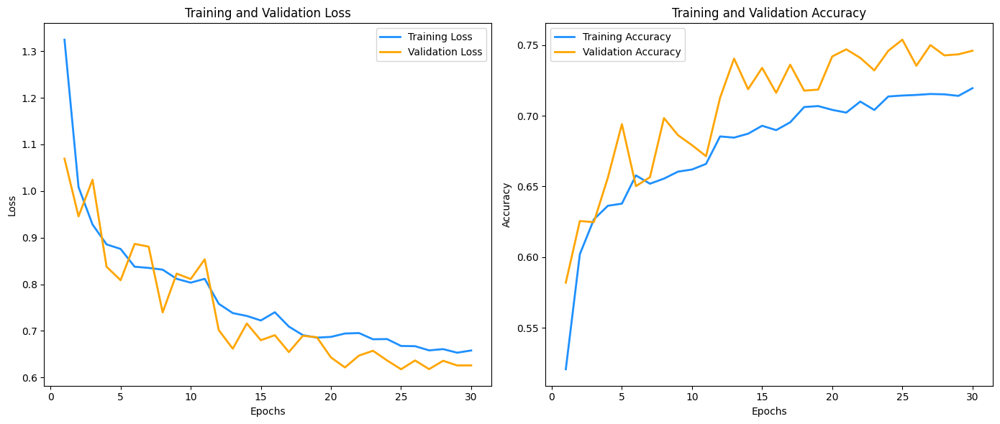

In [ ]:
# Extract history data
history_dict_vgg = history_vgg.history
epochs = range(1, len(history_dict_vgg['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_vgg['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_vgg['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_vgg['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_vgg['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

### **Using ResNet152V2**

In [ ]:
# Define the model
base_model_rasnet = ResNet152V2(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_rasnet.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_rasnet.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output = Dense(train_generator.num_classes, activation='softmax', name='crop_output')(x)

# Compile the model
model_rasnet = Model(inputs=base_model_rasnet.input, outputs=crop_output)
model_rasnet.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()])

234545216/234545216 [==============================] - 1s 0us/step


In [ ]:
# Train the model
history_rasnet = model_rasnet.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - ETA: 0s - loss: 1.1624 - accuracy: 0.6063 - precision_4: 0.6558 - recall_4: 0.5557 - f1score: 0.6016

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:2723: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


373/373 [==============================] - 230s 583ms/step - loss: 1.1624 - accuracy: 0.6063 - precision_4: 0.6558 - recall_4: 0.5557 - f1score: 0.6016 - val_loss: 0.7062 - val_accuracy: 0.7573 - val_precision_4: 0.7828 - val_recall_4: 0.7165 - val_f1score: 0.7482 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 216s 578ms/step - loss: 0.8287 - accuracy: 0.6817 - precision_4: 0.7238 - recall_4: 0.6312 - f1score: 0.6743 - val_loss: 0.6160 - val_accuracy: 0.7727 - val_precision_4: 0.8131 - val_recall_4: 0.7344 - val_f1score: 0.7717 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 204s 547ms/step - loss: 0.7006 - accuracy: 0.7150 - precision_4: 0.7582 - recall_4: 0.6631 - f1score: 0.7075 - val_loss: 0.6151 - val_accuracy: 0.7583 - val_precision_4: 0.7950 - val_recall_4: 0.7193 - val_f1score: 0.7552 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 220s 589ms/step - loss: 0.6535 - accuracy: 0.7258 - precision_4: 0.7681 - recall_4: 0.6801

In [ ]:
# Evaluate the ResNet152V2 model on the test set
test_loss_rasnet, test_accuracy_rasnet, test_precision_rasnet, test_recall_rasnet, test_f1score_rasnet = model_rasnet.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for ResNet152V2
print(f"ResNet152V2 - Test Loss: {test_loss_rasnet:.2f}")
print(f"ResNet152V2 - Test Accuracy: {test_accuracy_rasnet:.2f}")
print(f"ResNet152V2 - Test Precision: {test_precision_rasnet:.2f}")
print(f"ResNet152V2 - Test Recall: {test_recall_rasnet:.2f}")
print(f"ResNet152V2 - Test F1 Score: {test_f1score_rasnet:.2f}")

124/124 [==============================] - 33s 262ms/step - loss: 0.4331 - accuracy: 0.8377 - precision_4: 0.8606 - recall_4: 0.8165 - f1score: 0.8380
ResNet152V2 - Test Loss: 0.43
ResNet152V2 - Test Accuracy: 0.84
ResNet152V2 - Test Precision: 0.86
ResNet152V2 - Test Recall: 0.82
ResNet152V2 - Test F1 Score: 0.84


In [ ]:
# save model
model_rasnet.save('/content/drive/MyDrive/Dissertation/Trained_Models/resnet_model_main.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


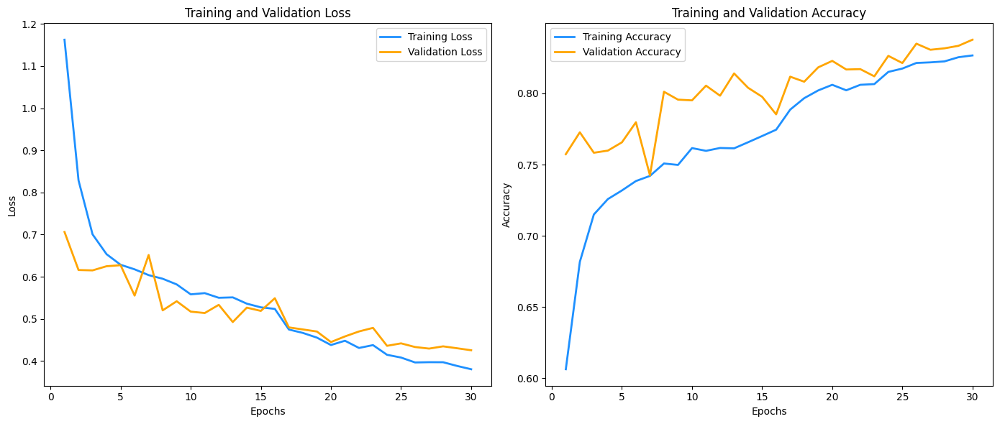

In [ ]:
# Extract history data
history_dict_rasnet = history_rasnet.history
epochs = range(1, len(history_dict_rasnet['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_rasnet['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_rasnet['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_rasnet['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_rasnet['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

### **Using InceptionResNetV2**

In [ ]:
# Define the model
base_model_incep = InceptionResNetV2(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_incep.trainable = False  # Freeze the base model

# Define the model with Batch Normalization
x = GlobalAveragePooling2D()(base_model_incep.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output = Dense(train_generator.num_classes, activation='softmax', name='crop_output')(x)

# Compile the model with just built-in metrics for now
model_incep = Model(inputs=base_model_incep.input, outputs=crop_output)
model_incep.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()]
)

219055592/219055592 [==============================] - 1s 0us/step


In [ ]:
# Train the model
history_incep = model_incep.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - 223s 597ms/step - loss: 0.9656 - accuracy: 0.6216 - precision_6: 0.6860 - recall_6: 0.5430 - f1score: 0.6062 - val_loss: 0.7931 - val_accuracy: 0.6948 - val_precision_6: 0.7573 - val_recall_6: 0.6190 - val_f1score: 0.6812 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 187s 502ms/step - loss: 0.8126 - accuracy: 0.6595 - precision_6: 0.7270 - recall_6: 0.5770 - f1score: 0.6434 - val_loss: 0.7944 - val_accuracy: 0.6784 - val_precision_6: 0.7453 - val_recall_6: 0.6084 - val_f1score: 0.6699 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 206s 552ms/step - loss: 0.7651 - accuracy: 0.6695 - precision_6: 0.7400 - recall_6: 0.5872 - f1score: 0.6548 - val_loss: 0.7671 - val_accuracy: 0.7026 - val_precision_6: 0.7685 - val_recall_6: 0.6250 - val_f1score: 0.6894 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 187s 502ms/step - loss: 0.7405 - accuracy: 0.6849 - precision_6: 0.7586 - recal

In [ ]:
# Evaluate the InceptionResNetV2 model on the test set
test_loss_incep, test_accuracy_incep, test_precision_incep, test_recall_incep, test_f1score_incep = model_incep.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

print(f"InceptionResNetV2 - Test Loss: {test_loss_incep:.2f}")
print(f"InceptionResNetV2 - Test Accuracy: {test_accuracy_incep:.2f}")
print(f"InceptionResNetV2 - Test Precision: {test_precision_incep:.2f}")
print(f"InceptionResNetV2 - Test Recall: {test_recall_incep:.2f}")
print(f"InceptionResNetV2 - Test F1 Score: {test_f1score_incep:.2f}")

124/124 [==============================] - 22s 180ms/step - loss: 0.4953 - accuracy: 0.8054 - precision_6: 0.8444 - recall_6: 0.7548 - f1score: 0.7971
InceptionResNetV2 - Test Loss: 0.50
InceptionResNetV2 - Test Accuracy: 0.81
InceptionResNetV2 - Test Precision: 0.84
InceptionResNetV2 - Test Recall: 0.75
InceptionResNetV2 - Test F1 Score: 0.80


In [ ]:
# save model
model_incep.save('/content/drive/MyDrive/Dissertation/Trained_Models/inception_resnet_model_main.h5')

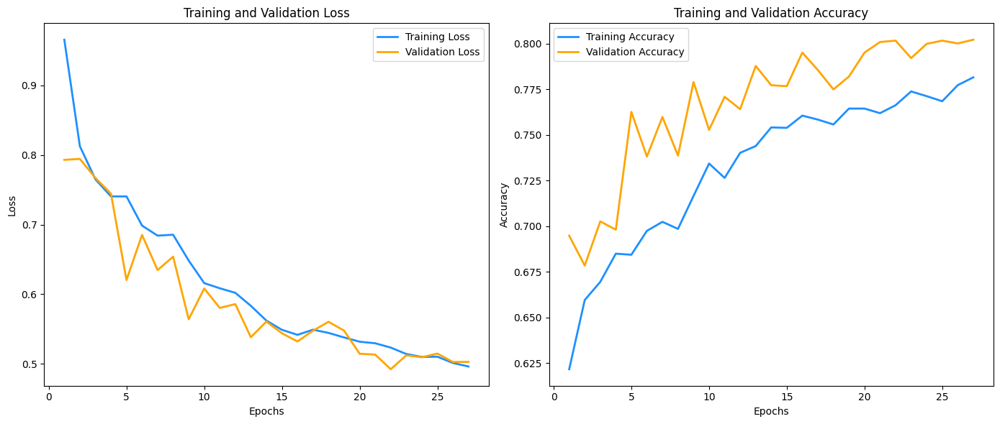

In [ ]:
# Extract history data
history_dict_incep = history_incep.history
epochs = range(1, len(history_dict_incep['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_incep['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_incep['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_incep['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_incep['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

### **Using EfficientNetB6**

In [ ]:
# Define the model
base_model_eff = EfficientNetB6(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_eff.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_eff.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output = Dense(train_generator.num_classes, activation='softmax', name='crop_output')(x)

# Compile the model
model_eff = Model(inputs=base_model_eff.input, outputs=crop_output)
model_eff.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()])

In [ ]:
# Train the model
history_eff = model_eff.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - 255s 622ms/step - loss: 3.0228 - accuracy: 0.0745 - precision_8: 0.0843 - recall_8: 0.0049 - f1score: 0.0093 - val_loss: 2.7241 - val_accuracy: 0.0842 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - val_f1score: 0.0000e+00 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 221s 593ms/step - loss: 2.9084 - accuracy: 0.0708 - precision_8: 0.0320 - recall_8: 9.2243e-04 - f1score: 0.0018 - val_loss: 2.7457 - val_accuracy: 0.0592 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - val_f1score: 0.0000e+00 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 216s 578ms/step - loss: 2.8284 - accuracy: 0.0718 - precision_8: 0.0552 - recall_8: 8.3857e-04 - f1score: 0.0017 - val_loss: 2.6924 - val_accuracy: 0.0622 - val_precision_8: 0.0000e+00 - val_recall_8: 0.0000e+00 - val_f1score: 0.0000e+00 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 224s 602ms/step - loss: 2.7824 - ac

In [ ]:
# Evaluate the EfficientNetB6 model on the test set
test_loss_eff, test_accuracy_eff, test_precision_eff, test_recall_eff, test_f1score_eff = model_eff.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for EfficientNetB6
print(f"EfficientNetB6 - Test Loss: {test_loss_eff:.2f}")
print(f"EfficientNetB6 - Test Accuracy: {test_accuracy_eff:.2f}")
print(f"EfficientNetB6 - Test Precision: {test_precision_eff:.2f}")
print(f"EfficientNetB6 - Test Recall: {test_recall_eff:.2f}")
print(f"EfficientNetB6 - Test F1 Score: {test_f1score_eff:.2f}")

124/124 [==============================] - 33s 267ms/step - loss: 2.6017 - accuracy: 0.0844 - precision_8: 0.0000e+00 - recall_8: 0.0000e+00 - f1score: 0.0000e+00
EfficientNetB6 - Test Loss: 2.60
EfficientNetB6 - Test Accuracy: 0.08
EfficientNetB6 - Test Precision: 0.00
EfficientNetB6 - Test Recall: 0.00
EfficientNetB6 - Test F1 Score: 0.00


In [ ]:
# save model
model_eff.save('/content/drive/MyDrive/Dissertation/Trained_Models/EfficientNetB6_model_main.h5')

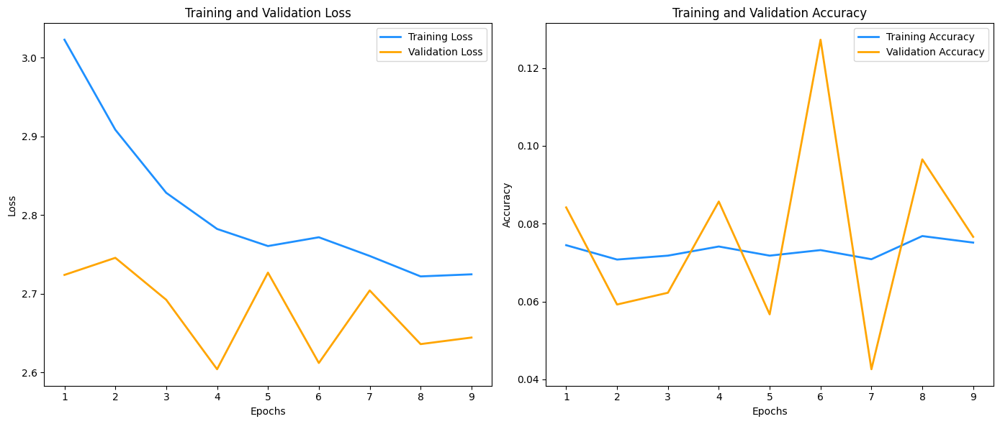

In [ ]:
# Extract history data
history_dict_eff = history_eff.history
epochs = range(1, len(history_dict_eff['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_eff['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_eff['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_eff['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_eff['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

### **Using DenseNet201**

In [ ]:
# Define the model
base_model_dense = DenseNet201(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_dense.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_dense.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output = Dense(train_generator.num_classes, activation='softmax', name='crop_output')(x)

# Compile the model
model_dense = Model(inputs=base_model_dense.input, outputs=crop_output)
model_dense.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()])

74836368/74836368 [==============================] - 1s 0us/step


In [ ]:
# Train the model
history_dense = model_dense.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - 208s 504ms/step - loss: 0.9804 - accuracy: 0.6512 - precision_10: 0.7032 - recall_10: 0.6012 - f1score: 0.6482 - val_loss: 0.5798 - val_accuracy: 0.7770 - val_precision_10: 0.8050 - val_recall_10: 0.7510 - val_f1score: 0.7771 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 182s 489ms/step - loss: 0.6801 - accuracy: 0.7270 - precision_10: 0.7693 - recall_10: 0.6839 - f1score: 0.7241 - val_loss: 0.5949 - val_accuracy: 0.7707 - val_precision_10: 0.7997 - val_recall_10: 0.7374 - val_f1score: 0.7673 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 180s 481ms/step - loss: 0.5962 - accuracy: 0.7502 - precision_10: 0.7913 - recall_10: 0.7079 - f1score: 0.7473 - val_loss: 0.5543 - val_accuracy: 0.7775 - val_precision_10: 0.8123 - val_recall_10: 0.7440 - val_f1score: 0.7766 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 184s 493ms/step - loss: 0.5644 - accuracy: 0.7588 - precision_10: 0

In [ ]:
# Evaluate the DenseNet201 model on the test set
test_loss_dense, test_accuracy_dense, test_precision_dense, test_recall_dense, test_f1score_dense = model_dense.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for DenseNet201
print(f"DenseNet201 - Test Loss: {test_loss_dense:.2f}")
print(f"DenseNet201 - Test Accuracy: {test_accuracy_dense:.2f}")
print(f"DenseNet201 - Test Precision: {test_precision_dense:.2f}")
print(f"DenseNet201 - Test Recall: {test_recall_dense:.2f}")
print(f"DenseNet201 - Test F1 Score: {test_f1score_dense:.2f}")

124/124 [==============================] - 19s 149ms/step - loss: 0.4185 - accuracy: 0.8309 - precision_10: 0.8556 - recall_10: 0.8165 - f1score: 0.8356
DenseNet201 - Test Loss: 0.42
DenseNet201 - Test Accuracy: 0.83
DenseNet201 - Test Precision: 0.86
DenseNet201 - Test Recall: 0.82
DenseNet201 - Test F1 Score: 0.84


In [ ]:
# save model
model_dense.save('/content/drive/MyDrive/Dissertation/Trained_Models/dense_model_main.h5')

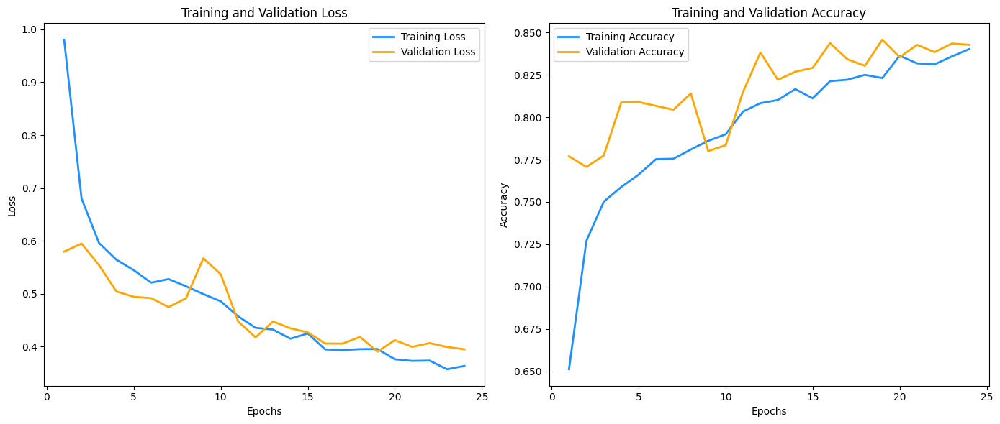

In [ ]:
# Extract history data
history_dict_dense = history_dense.history
epochs = range(1, len(history_dict_dense['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_dense['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_dense['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_dense['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_dense['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

### **Using NASNetLarge**

In [ ]:
# Define the model
base_model_nasnet = NASNetLarge(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_nasnet.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_nasnet.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output = Dense(train_generator.num_classes, activation='softmax', name='crop_output')(x)

# Compile the model
model_nasnet = Model(inputs=base_model_nasnet.input, outputs=crop_output)
model_nasnet.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()])

343610240/343610240 [==============================] - 6s 0us/step


In [ ]:
# Train the model
history_nasnet = model_nasnet.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - 309s 765ms/step - loss: 1.3098 - accuracy: 0.5675 - precision_12: 0.6257 - recall_12: 0.5041 - f1score: 0.5583 - val_loss: 0.7982 - val_accuracy: 0.7268 - val_precision_12: 0.7576 - val_recall_12: 0.6767 - val_f1score: 0.7149 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 281s 754ms/step - loss: 0.9166 - accuracy: 0.6486 - precision_12: 0.6967 - recall_12: 0.5850 - f1score: 0.6360 - val_loss: 0.7740 - val_accuracy: 0.7124 - val_precision_12: 0.7626 - val_recall_12: 0.6575 - val_f1score: 0.7062 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 280s 751ms/step - loss: 0.7999 - accuracy: 0.6750 - precision_12: 0.7272 - recall_12: 0.6147 - f1score: 0.6662 - val_loss: 0.7360 - val_accuracy: 0.7238 - val_precision_12: 0.7778 - val_recall_12: 0.6492 - val_f1score: 0.7077 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 279s 747ms/step - loss: 0.7448 - accuracy: 0.6943 - precision_12: 0

In [ ]:
# Evaluate the NASNetLarge model on the test set
test_loss_nasnet, test_accuracy_nasnet, test_precision_nasnet, test_recall_nasnet, test_f1score_nasnet = model_nasnet.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for NASNetLarge
print(f"NASNetLarge - Test Loss: {test_loss_nasnet:.2f}")
print(f"NASNetLarge - Test Accuracy: {test_accuracy_nasnet:.2f}")
print(f"NASNetLarge - Test Precision: {test_precision_nasnet:.2f}")
print(f"NASNetLarge - Test Recall: {test_recall_nasnet:.2f}")
print(f"NASNetLarge - Test F1 Score: {test_f1score_nasnet:.2f}")

124/124 [==============================] - 51s 411ms/step - loss: 0.5647 - accuracy: 0.7820 - precision_12: 0.8214 - recall_12: 0.7243 - f1score: 0.7698
NASNetLarge - Test Loss: 0.56
NASNetLarge - Test Accuracy: 0.78
NASNetLarge - Test Precision: 0.82
NASNetLarge - Test Recall: 0.72
NASNetLarge - Test F1 Score: 0.77


In [ ]:
# save model
model_nasnet.save('/content/drive/MyDrive/Dissertation/Trained_Models/nasnet_model_main.h5')

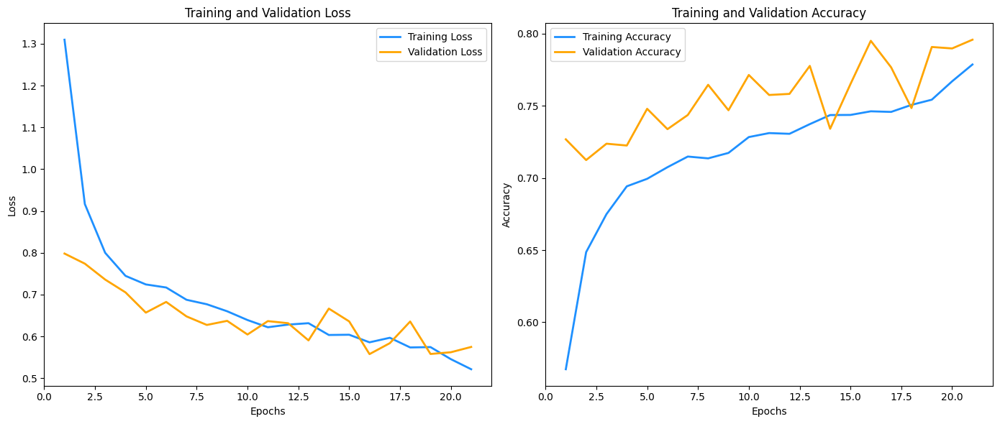

In [ ]:
# Extract history data
history_dict_nasnet = history_nasnet.history
epochs = range(1, len(history_dict_nasnet['accuracy']) + 1)

# Set the color palette manually for better distinction
train_color = 'dodgerblue'
val_color = 'orange'

# Create a figure with two subplots in the same row
plt.figure(figsize=(14, 6))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict_nasnet['loss'], label='Training Loss', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_nasnet['val_loss'], label='Validation Loss', color=val_color, linewidth=2)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict_nasnet['accuracy'], label='Training Accuracy', color=train_color, linewidth=2)
plt.plot(epochs, history_dict_nasnet['val_accuracy'], label='Validation Accuracy', color=val_color, linewidth=2)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

### **Using ConvNeXtXLarge**

In [ ]:
# Define the model
base_model_cnxl = ConvNeXtXLarge(weights='imagenet', include_top=False, input_tensor=Input(shape=(224, 224, 3)))
base_model_cnxl.trainable = False  # Freeze the base model

# Add custom layers for crop classification
x = GlobalAveragePooling2D()(base_model_cnxl.output)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)  # Add Batch Normalization
x = Dropout(0.5)(x)
crop_output = Dense(train_generator.num_classes, activation='softmax', name='crop_output')(x)

# Compile the model
model_cnxl = Model(inputs=base_model_cnxl.input, outputs=crop_output)
model_cnxl.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', Precision(), Recall(), F1Score()]
)

In [ ]:
# Train the model
history_cnxl = model_cnxl.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_steps=val_generator.samples // val_generator.batch_size,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, reduce_lr],  # Add the reduce_lr callback here
    verbose=1
)

Epoch 1/30
373/373 [==============================] - 858s 2s/step - loss: 1.8090 - accuracy: 0.3990 - precision_21: 0.5175 - recall_21: 0.2499 - f1score: 0.3370 - val_loss: 1.7549 - val_accuracy: 0.4254 - val_precision_21: 0.5609 - val_recall_21: 0.3112 - val_f1score: 0.4003 - lr: 0.0010
Epoch 2/30
373/373 [==============================] - 879s 2s/step - loss: 1.4336 - accuracy: 0.4847 - precision_21: 0.6218 - recall_21: 0.3395 - f1score: 0.4392 - val_loss: 2.6476 - val_accuracy: 0.3657 - val_precision_21: 0.4406 - val_recall_21: 0.3281 - val_f1score: 0.3761 - lr: 0.0010
Epoch 3/30
373/373 [==============================] - 881s 2s/step - loss: 1.3171 - accuracy: 0.5103 - precision_21: 0.6491 - recall_21: 0.3639 - f1score: 0.4664 - val_loss: 1.5198 - val_accuracy: 0.5098 - val_precision_21: 0.5865 - val_recall_21: 0.4315 - val_f1score: 0.4972 - lr: 0.0010
Epoch 4/30
373/373 [==============================] - 822s 2s/step - loss: 1.2647 - accuracy: 0.5247 - precision_21: 0.6601 - reca

In [ ]:
# Evaluate the ConvNeXtXLarge model on the test set
test_loss_cnxl, test_accuracy_cnxl, test_precision_cnxl, test_recall_cnxl, test_f1score_cnxl = model_cnxl.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)

# Print metrics for ConvNeXtXLarge
print(f"ConvNeXtXLarge - Test Loss: {test_loss_cnxl:.2f}")
print(f"ConvNeXtXLarge - Test Accuracy: {test_accuracy_cnxl:.2f}")
print(f"ConvNeXtXLarge - Test Precision: {test_precision_cnxl:.2f}")
print(f"ConvNeXtXLarge - Test Recall: {test_recall_cnxl:.2f}")
print(f"ConvNeXtXLarge - Test F1 Score: {test_f1score_cnxl:.2f}")

124/124 [==============================] - 205s 2s/step - loss: 1.0499 - accuracy: 0.6089 - precision_21: 0.6893 - recall_21: 0.5285 - f1score: 0.5983
ConvNeXtXLarge - Test Loss: 1.05
ConvNeXtXLarge - Test Accuracy: 0.61
ConvNeXtXLarge - Test Precision: 0.69
ConvNeXtXLarge - Test Recall: 0.53
ConvNeXtXLarge - Test F1 Score: 0.60


In [ ]:
# save model
model_cnxl.save('/content/drive/MyDrive/Dissertation/Trained_Models/ConvNeXtXLarge_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### **General Evaluations & Comaprative analysis**

In [ ]:
# List of model histories and names
histories = [history_incep, history_xception, history_vgg, history_rasnet, history_dense, history_nasnet, history_cnxl]
model_names = ["InceptionResNetV2", "Xception", "VGG16", "ResNet152V2", "DenseNet201", "NASNetLarge", "ConvNeXtXLarge"]

In [ ]:
# SAVED HISTORY AS JSON

In [ ]:
# storing model histories in a dictionary
model_histories_1 = {
    "InceptionResNetV2": history_incep,
    "Xception": history_xception,
    "VGG16": history_vgg,
    "ResNet152V2": history_rasnet,
    "EfficientNetB6": history_eff,
    "DenseNet201": history_dense,
    "NASNetLarge": history_nasnet,
    "ConvNeXtXLarge": history_cnxl
}

In [ ]:
# storing model histories in a list of dictionaries
model_histories_2 = [
    {"Model": "InceptionResNetV2", "History": history_incep},
    {"Model": "Xception", "History": history_xception},
    {"Model": "VGG16", "History": history_vgg},
    {"Model": "ResNet152V2", "History": history_rasnet},
    {"Model": "EfficientNetB6", "History": history_eff},
    {"Model": "DenseNet201", "History": history_dense},
    {"Model": "NASNetLarge", "History": history_nasnet},
    {"Model": "ConvNeXtXLarge", "History": history_cnxl}
]

In [ ]:
import pickle

# Define the path where you want to save the file in your Google Drive
save_path = '/content/drive/MyDrive/Dissertation/Trained_Models/model_histories_1.pkl'

# Save all model histories to the specified path in Google Drive
with open(save_path, 'wb') as file:
    pickle.dump(model_histories_1, file)

In [ ]:
# Define the path where you want to save the file in your Google Drive
save_path = '/content/drive/MyDrive/Dissertation/Trained_Models/model_histories_2.pkl'

# Save all model histories to the specified path in Google Drive
with open(save_path, 'wb') as file:
    pickle.dump(model_histories_2, file)

In [ ]:
import json
import numpy as np

def convert_to_serializable(history):
    serializable_history = {}
    for key, value in history.items():
        if isinstance(value, np.ndarray):
            serializable_history[key] = value.tolist()  # Convert NumPy arrays to lists
        elif isinstance(value, (np.float32, np.float64)):
            serializable_history[key] = float(value)  # Convert NumPy floats to Python floats
        elif isinstance(value, list):
            serializable_history[key] = [float(x) if isinstance(x, (np.float32, np.float64)) else x for x in value]
        else:
            serializable_history[key] = value
    return serializable_history

# Convert each model's history to a serializable format
history_serializable = {model_name: convert_to_serializable(history.history) for model_name, history in model_histories_1.items()}

# Save the serializable histories to a JSON file
json_save_path = '/content/drive/MyDrive/Dissertation/Trained_Models/model_histories_1.json'
with open(json_save_path, 'w') as file:
    json.dump(history_serializable, file)


In [ ]:
# Combine all results into a list of dictionaries
all_results = [
    {"Model": "Xception", "Test Loss": test_loss_xception, "Test Accuracy": test_accuracy_xception, "Test Precision": test_precision_xception, "Test Recall": test_recall_xception, "Test F1 Score": test_f1score_xception},
    {"Model": "VGG16", "Test Loss": test_loss_vgg, "Test Accuracy": test_accuracy_vgg, "Test Precision": test_precision_vgg, "Test Recall": test_recall_vgg, "Test F1 Score": test_f1score_vgg},
    {"Model": "ResNet152V2", "Test Loss": test_loss_resnet, "Test Accuracy": test_accuracy_resnet, "Test Precision": test_precision_resnet, "Test Recall": test_recall_resnet, "Test F1 Score": test_f1score_resnet},
    {"Model": "InceptionResNetV2", "Test Loss": test_loss_incep, "Test Accuracy": test_accuracy_incep, "Test Precision": test_precision_incep, "Test Recall": test_recall_incep, "Test F1 Score": test_f1score_incep},
    {"Model": "DenseNet201", "Test Loss": test_loss_dense, "Test Accuracy": test_accuracy_dense, "Test Precision": test_precision_dense, "Test Recall": test_recall_dense, "Test F1 Score": test_f1score_dense},
    {"Model": "NASNetLarge", "Test Loss": test_loss_nasnet, "Test Accuracy": test_accuracy_nasnet, "Test Precision": test_precision_nasnet, "Test Recall": test_recall_nasnet, "Test F1 Score": test_f1score_nasnet},
    {"Model": "ConvNeXtXLarge", "Test Loss": test_loss_cnxl, "Test Accuracy": test_accuracy_cnxl, "Test Precision": test_precision_cnxl, "Test Recall": test_recall_cnxl, "Test F1 Score": test_f1score_cnxl},
]

# Create a DataFrame from the list of dictionaries
df_results = pd.DataFrame(all_results)

# Display the combined results
print(df_results)

               Model  Test Loss  Test Accuracy  Test Precision  Test Recall  \
0           Xception   0.491549       0.810484        0.834374     0.774446   
1              VGG16   0.637444       0.746724        0.797368     0.687248   
2        ResNet152V2   0.435543       0.836946        0.859761     0.815776   
3  InceptionResNetV2   0.495338       0.805444        0.844376     0.754788   
4        DenseNet201   0.418530       0.830897        0.855559     0.816532   
5        NASNetLarge   0.564713       0.782006        0.821378     0.724294   
6     ConvNeXtXLarge   1.049925       0.608871        0.689349     0.528478   

   Test F1 Score  
0       0.803294  
1       0.738224  
2       0.837191  
3       0.797072  
4       0.835590  
5       0.769787  
6       0.598288  


In [ ]:
# Melt the DataFrame for plotting
df_melted = df_results.melt(id_vars="Model", var_name="Metric", value_name="Value")

# Filter out None values (in case some models don't have all metrics)
df_melted = df_melted[df_melted["Value"].notna()]

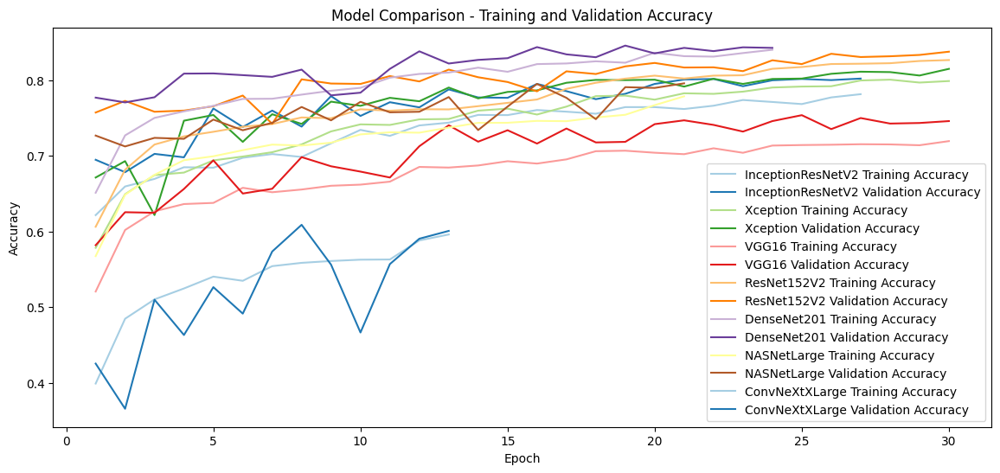

In [ ]:
def compare_model_accuracies(histories, model_names):
    plt.figure(figsize=(14, 6))

    for history, model_name in zip(histories, model_names):
        epochs = range(1, len(history.history['accuracy']) + 1)
        plt.plot(epochs, history.history['accuracy'], label=f'{model_name} Training Accuracy')
        plt.plot(epochs, history.history['val_accuracy'], label=f'{model_name} Validation Accuracy')

    plt.title('Model Comparison - Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

# Compare accuracies
compare_model_accuracies(histories, model_names)

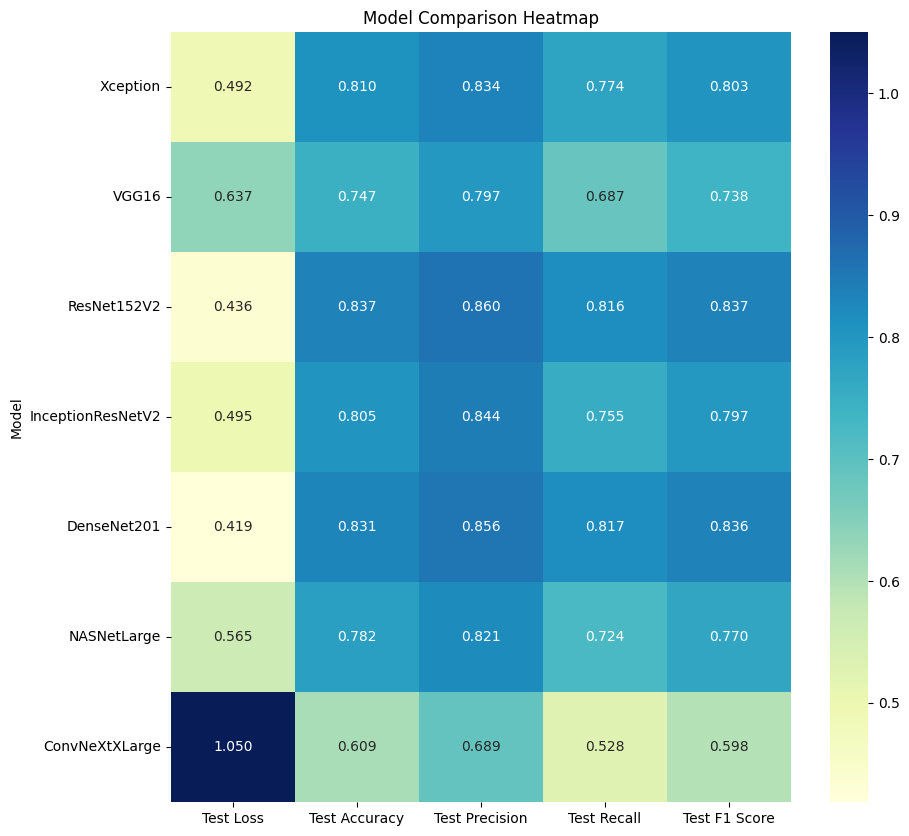

In [ ]:
# Create a pivot table for the heatmap
df_pivot = df_results.set_index('Model')

# Plot heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(df_pivot, annot=True, cmap="YlGnBu", fmt=".3f")
plt.title('Model Comparison Heatmap')
plt.show()


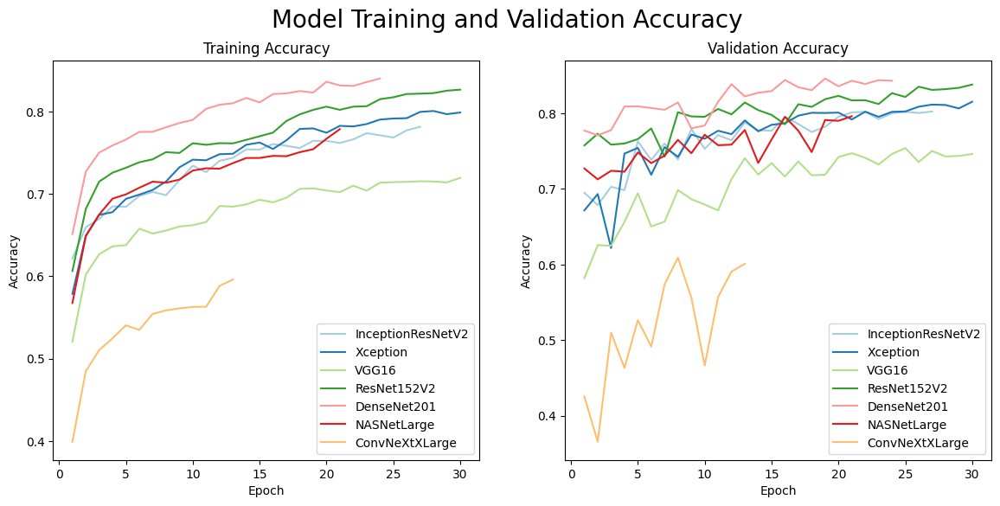

In [ ]:
def plot_model_accuracies(histories, model_names):
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    for history, model_name in zip(histories, model_names):
        epochs = range(1, len(history.history['accuracy']) + 1)
        plt.plot(epochs, history.history['accuracy'], label=f'{model_name}')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    for history, model_name in zip(histories, model_names):
        epochs = range(1, len(history.history['val_accuracy']) + 1)
        plt.plot(epochs, history.history['val_accuracy'], label=f'{model_name}')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.suptitle('Model Training and Validation Accuracy', size=20)
    plt.show()

# Call the function to plot
plot_model_accuracies(histories, model_names)

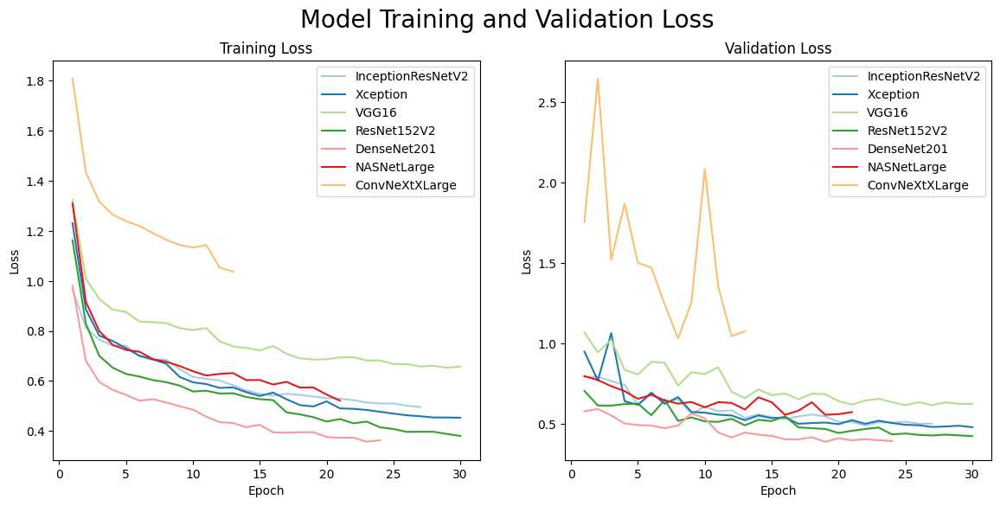

In [ ]:
def plot_model_losses(histories, model_names):
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    for history, model_name in zip(histories, model_names):
        epochs = range(1, len(history.history['loss']) + 1)
        plt.plot(epochs, history.history['loss'], label=f'{model_name}')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    for history, model_name in zip(histories, model_names):
        epochs = range(1, len(history.history['val_loss']) + 1)
        plt.plot(epochs, history.history['val_loss'], label=f'{model_name}')
    plt.title('Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.suptitle('Model Training and Validation Loss', size=20)
    plt.show()

# Call the function to plot
plot_model_losses(histories, model_names)

In [ ]:
# Use a styled DataFrame for a clean and visually appealing table
styled_df = df_results.style.background_gradient(cmap="YlGnBu", axis=0)
styled_df

,Model,Test Loss,Test Accuracy,Test Precision,Test Recall,Test F1 Score
0,Xception,0.491549,0.810484,0.834374,0.774446,0.803294
1,VGG16,0.637444,0.746724,0.797368,0.687248,0.738224
2,ResNet152V2,0.435543,0.836946,0.859761,0.815776,0.837191
3,InceptionResNetV2,0.495338,0.805444,0.844376,0.754788,0.797072
4,EfficientNetB6,2.601729,0.084425,0.000000,0.000000,0.000000
5,DenseNet201,0.418530,0.830897,0.855559,0.816532,0.835590
6,NASNetLarge,0.564713,0.782006,0.821378,0.724294,0.769787
7,ConvNeXtXLarge,1.049925,0.608871,0.689349,0.528478,0.598288


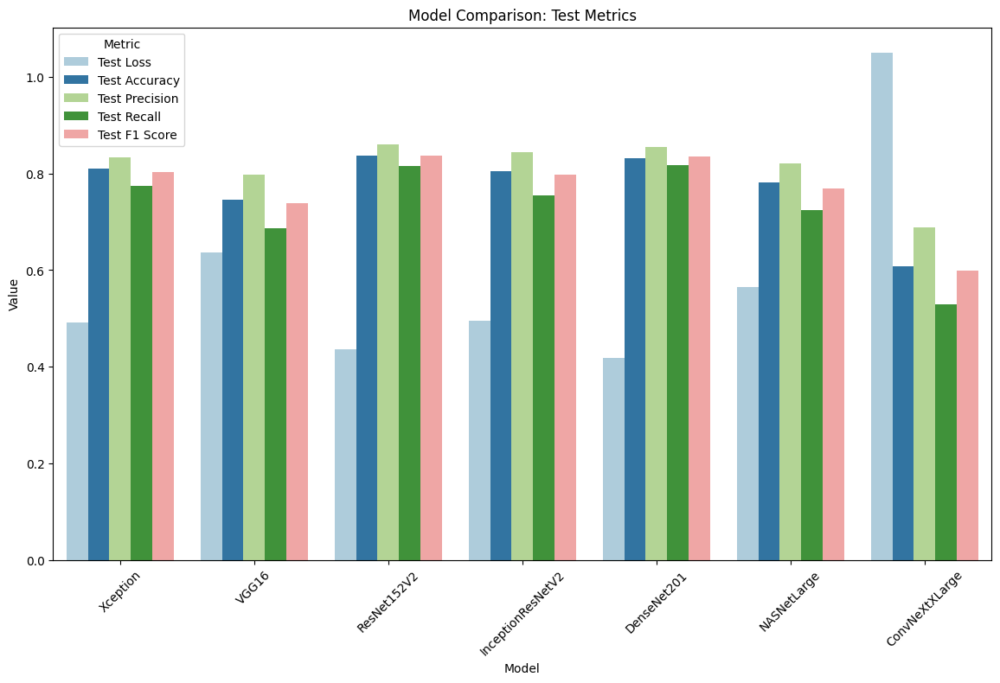

In [ ]:
# Set the color palette to Paired
sns.set_palette("Paired")

# Plot the grouped bar chart for each metric
plt.figure(figsize=(14, 8))
sns.barplot(x="Model", y="Value", hue="Metric", data=df_melted)
plt.xlabel('Model')
plt.ylabel('Value')
plt.title('Model Comparison: Test Metrics')
plt.legend(title='Metric')
plt.xticks(rotation=45)
plt.show()


# **Masking & Annotation**

In [16]:
def otsu_thresholding(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return None
    blur = cv2.GaussianBlur(image, (5, 5), 0)
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    return thresh

def adaptive_thresholding(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return None
    thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 11, 2)
    return thresh

def sobel_edge_detection(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return None
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
    sobel = cv2.sqrt(sobelx**2 + sobely**2)
    sobel = cv2.convertScaleAbs(sobel)
    return sobel

def contour_detection(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return None

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Canny Edge Detection
    edges = cv2.Canny(gray, 100, 200)

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on a blank image
    contour_image = np.zeros_like(image)
    cv2.drawContours(contour_image, contours, -1, (255, 255, 255), thickness=1)

    return contour_image


# Define a new function to display images as described
def display_all_methods(sample_images, methods, title_fontsize=16):
    n_methods = len(methods) + 1  # +1 for the original image
    plt.figure(figsize=(5 * n_methods, 5 * len(sample_images)))

    for i, path in enumerate(sample_images):
        # Display original image
        img = cv2.imread(path)
        if img is not None:
            plt.subplot(len(sample_images), n_methods, i * n_methods + 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            if i == 0:
                plt.title("Original", fontsize=title_fontsize)
            plt.axis('off')

        # Display results of each method
        for j, (method_name, method_func) in enumerate(methods.items()):
            result = method_func(path)
            plt.subplot(len(sample_images), n_methods, i * n_methods + j + 2)
            plt.imshow(result, cmap='gray')
            if i == 0:  # Only add titles on the first row
                plt.title(method_name, fontsize=title_fontsize)
            plt.axis('off')

    plt.tight_layout()
    plt.show()


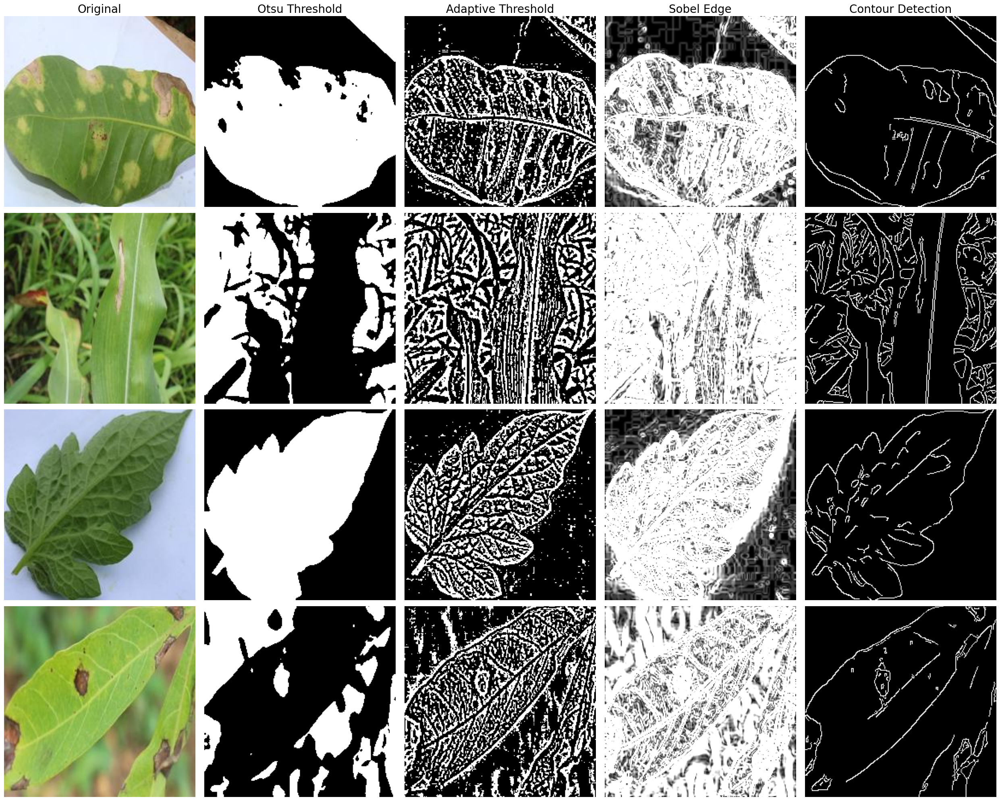

In [17]:
# Sample images, make sure these are the correct paths
sample_images = [
    '/content/CCMT_crop_diseases/Cashew_anthracnose/anthracnose1083_.jpg',
    '/content/CCMT_crop_diseases/Maize_leaf blight/leaf blight632_.jpg',
    '/content/CCMT_crop_diseases/Tomato_healthy/healthy166_.jpg',
    '/content/CCMT_crop_diseases/Cassava_brown spot/brown spot326_.jpg'
]

# Define all methods in a dictionary
methods = {
    "Otsu Threshold": otsu_thresholding,
    "Adaptive Threshold": adaptive_thresholding,
    "Sobel Edge": sobel_edge_detection,
    "Contour Detection": contour_detection,
}

# Display all methods with an increased title font size
display_all_methods(sample_images, methods, title_fontsize=20)

### Fusion of Techniques

The best two performoing methods from the methods above were fussed to achieve a more comprehensive method to differentiate between the foreground and background of interest.

In [ ]:
#Mask Generation and Refinement

In [ ]:
# Utility Functions
# Function to generate refined mask
def generate_refined_mask(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return None

    blur = cv2.GaussianBlur(image, (5, 5), 0)
    thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 9, 2)
    thresh = cv2.bitwise_not(thresh)

    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

    contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest_contour) > 1000:
            mask = np.zeros_like(thresh)
            cv2.fillPoly(mask, [largest_contour], 255)
        else:
            mask = np.zeros_like(thresh)
    else:
        mask = np.zeros_like(thresh)

    return mask

# Function for mask refinement
def refine_mask(mask, kernel_size=(5, 5), iter_dilate=1, iter_erode=1):
    kernel = np.ones(kernel_size, np.uint8)
    mask = cv2.dilate(mask, kernel, iterations=iter_dilate)
    mask = cv2.erode(mask, kernel, iterations=iter_erode)
    return mask

# Process the dataset
def process_dataset(directory, output_directory):
    if not os.path.exists(directory):
        print(f"Input directory does not exist: {directory}")
        return

    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
        print(f"Output directory created: {output_directory}")

    for subdir, _, files in os.walk(directory):
        subdir_name = os.path.relpath(subdir, directory)
        output_subdir = os.path.join(output_directory, subdir_name)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)

        for filename in files:
            if filename.endswith(".jpg"):
                image_path = os.path.join(subdir, filename)
                print(f"Processing {image_path}...")
                mask = generate_refined_mask(image_path)
                if mask is not None:
                    output_path = os.path.join(output_subdir, filename)
                    cv2.imwrite(output_path, mask)
                    print(f"Mask saved to {output_path}")
                else:
                    print(f"Failed to generate mask for {filename}")

# Helper function to get image and mask file paths
def get_image_mask_pairs(image_dir, mask_dir):
    image_mask_pairs = []
    for root, _, files in os.walk(image_dir):
        for file in files:
            if file.endswith(".jpg"):
                image_path = os.path.join(root, file)
                mask_path = os.path.join(mask_dir, os.path.relpath(image_path, image_dir))
                if os.path.exists(mask_path):
                    image_mask_pairs.append((image_path, mask_path))
    return image_mask_pairs

Processing: /content/CCMT_crop_diseases/Tomato_healthy/healthy165_.jpg
Processing: /content/CCMT_crop_diseases/Cashew_red rust/red rust1630_.jpg
Processing: /content/CCMT_crop_diseases/Maize_leaf spot/leaf spot24_.jpg
Processing: /content/CCMT_crop_diseases/Cassava_mosaic/mosaic569_.jpg


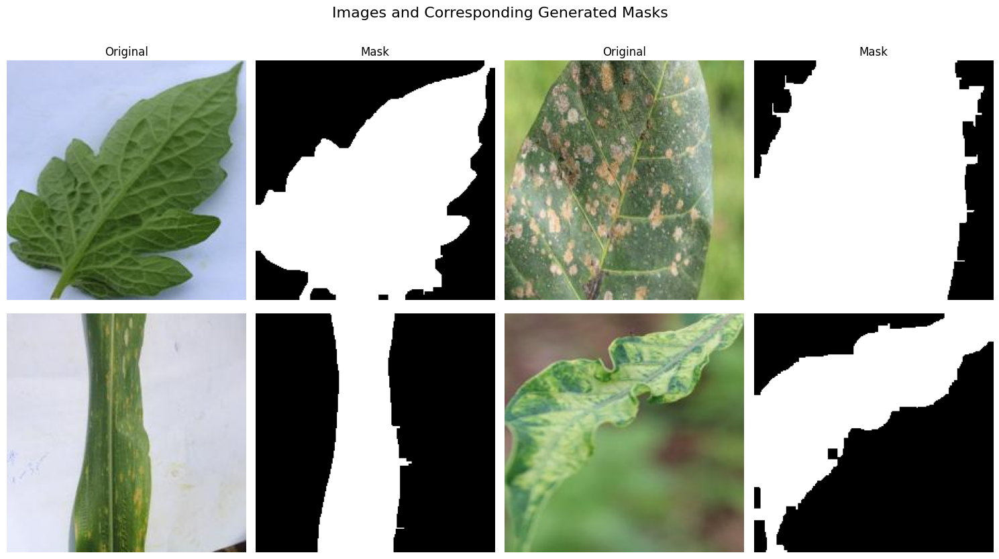

In [ ]:
# Paths to your sample images (replace with actual paths)
sample_images = [
    '/content/CCMT_crop_diseases/Tomato_healthy/healthy165_.jpg',
    '/content/CCMT_crop_diseases/Cashew_red rust/red rust1630_.jpg',
    '/content/CCMT_crop_diseases/Maize_leaf spot/leaf spot24_.jpg',
    '/content/CCMT_crop_diseases/Cassava_mosaic/mosaic569_.jpg'
]

# Create a figure for displaying all images and masks in a 2x2 grid
plt.figure(figsize=(15, 10))  # Adjust the size to fit the plot

# Loop over the sample images and display the results
for i, image_path in enumerate(sample_images):
    print(f"Processing: {image_path}")

    # Generate the mask using the refined function
    mask = generate_refined_mask(image_path)

    # Load the original image for display
    original_image = cv2.imread(image_path)

    # Display original image and mask side by side
    if mask is not None:
        # Plot the Original Image
        plt.subplot(2, 4, 2*i + 1)
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
        if i < 2:
            plt.title("Original")
        plt.axis("off")

        # Plot the Generated Mask
        plt.subplot(2, 4, 2*i + 2)
        plt.imshow(mask, cmap='gray')
        if i < 2:
            plt.title("Mask")
        plt.axis("off")
    else:
        print(f"Failed to generate mask for {image_path}")

# Adjust layout to prevent overlap and display the plot
plt.suptitle("Images and Corresponding Generated Masks", fontsize=16)
plt.tight_layout(rect=[0, 0.1, 1, 1])  # Adjust layout to make room for the suptitle
plt.show()


In [ ]:
# Set parameters for the dataset
output_dir = '/content/CCMT_mask_diseases'  # Replace with your output path
image_dir = main_dir
mask_dir = output_dir

# Process the dataset to generate masks
process_dataset(main_dir, output_dir)

# Get image and mask pairs
image_mask_pairs = get_image_mask_pairs(image_dir, mask_dir)

Streaming output truncated to the last 5000 lines.
Processing /content/CCMT_crop_diseases/Tomato_leaf blight/leaf blight678_.jpg...
Mask saved to /content/CCMT_mask_diseases/Tomato_leaf blight/leaf blight678_.jpg
Processing /content/CCMT_crop_diseases/Tomato_leaf blight/leaf blight891_.jpg...
Mask saved to /content/CCMT_mask_diseases/Tomato_leaf blight/leaf blight891_.jpg
Processing /content/CCMT_crop_diseases/Tomato_leaf blight/leaf blight962_.jpg...
Mask saved to /content/CCMT_mask_diseases/Tomato_leaf blight/leaf blight962_.jpg
Processing /content/CCMT_crop_diseases/Tomato_leaf blight/leaf blight748_.jpg...
Mask saved to /content/CCMT_mask_diseases/Tomato_leaf blight/leaf blight748_.jpg
Processing /content/CCMT_crop_diseases/Tomato_leaf blight/leaf blight641_.jpg...
Mask saved to /content/CCMT_mask_diseases/Tomato_leaf blight/leaf blight641_.jpg
Processing /content/CCMT_crop_diseases/Tomato_leaf blight/leaf blight446_.jpg...
Mask saved to /content/CCMT_mask_diseases/Tomato_leaf blig

# **Image Segmentation**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, Input
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
# Define the Data Generator Class
# Define custom data generator
class ImageMaskGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_mask_pairs, batch_size, image_size):
        self.image_mask_pairs = image_mask_pairs
        self.batch_size = batch_size
        self.image_size = image_size
        self.indexes = np.arange(len(self.image_mask_pairs))
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_mask_pairs) / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        batch_pairs = [self.image_mask_pairs[k] for k in batch_indexes]
        images, masks = self.__data_generation(batch_pairs)
        return images, masks

    def on_epoch_end(self):
        np.random.shuffle(self.indexes)

    def __data_generation(self, batch_pairs):
        images = np.zeros((self.batch_size, *self.image_size, 3), dtype=np.float32)
        masks = np.zeros((self.batch_size, *self.image_size, 1), dtype=np.float32)

        for i, (img_path, mask_path) in enumerate(batch_pairs):
            img = cv2.imread(img_path)
            img = cv2.resize(img, self.image_size)
            img = img / 255.0

            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, self.image_size)
            mask = np.expand_dims(mask, axis=-1)
            mask = mask / 255.0

            images[i] = img
            masks[i] = mask

        return images, masks

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Define custom metrics
def iou(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / (union + tf.keras.backend.epsilon())

In [ ]:
# First split: 80% training and 20% temporary (for validation and test)
train_pairs, temp_pairs = train_test_split(image_mask_pairs, test_size=0.2, random_state=42)

# Second split: 50% of the temporary set for validation and 50% for test (which makes 10% each of the total)
val_pairs, test_pairs = train_test_split(temp_pairs, test_size=0.5, random_state=42)

print(f"Training set size: {len(train_pairs)}")
print(f"Validation set size: {len(val_pairs)}")
print(f"Test set size: {len(test_pairs)}")

# Create data generators
batch_size = 32
image_size = (224, 224)
train_generator = ImageMaskGenerator(train_pairs, batch_size, image_size)
validation_generator = ImageMaskGenerator(val_pairs, batch_size, image_size)
test_generator = ImageMaskGenerator(test_pairs, batch_size, image_size)

Training set size: 15951
Validation set size: 1994
Test set size: 1994


In [ ]:
# Custom Loss Function
# Define edge-aware loss function
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return 1 - numerator / denominator

def bce_dice_loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

### **Using SegNet**

In [ ]:
# SegNet model definition
def segnet_model(input_size=(224, 224, 3)):
    inputs = layers.Input(input_size)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Activation('relu')(conv1)
    conv1 = layers.Conv2D(64, (3, 3), padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Activation('relu')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Activation('relu')(conv2)
    conv2 = layers.Conv2D(128, (3, 3), padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Activation('relu')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Activation('relu')(conv3)
    conv3 = layers.Conv2D(256, (3, 3), padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Activation('relu')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(512, (3, 3), padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Activation('relu')(conv4)
    conv4 = layers.Conv2D(512, (3, 3), padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Activation('relu')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = layers.Conv2D(512, (3, 3), padding='same')(pool4)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Activation('relu')(conv5)
    conv5 = layers.Conv2D(512, (3, 3), padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Activation('relu')(conv5)
    pool5 = layers.MaxPooling2D(pool_size=(2, 2))(conv5)

    # Decoder
    up6 = layers.UpSampling2D(size=(2, 2))(pool5)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(up6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Activation('relu')(conv6)
    conv6 = layers.Conv2D(512, (3, 3), padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Activation('relu')(conv6)

    up7 = layers.UpSampling2D(size=(2, 2))(conv6)
    conv7 = layers.Conv2D(512, (3, 3), padding='same')(up7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Activation('relu')(conv7)
    conv7 = layers.Conv2D(512, (3, 3), padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Activation('relu')(conv7)

    up8 = layers.UpSampling2D(size=(2, 2))(conv7)
    conv8 = layers.Conv2D(256, (3, 3), padding='same')(up8)
    conv8 = layers.BatchNormalization()(conv8)
    conv8 = layers.Activation('relu')(conv8)
    conv8 = layers.Conv2D(256, (3, 3), padding='same')(conv8)
    conv8 = layers.BatchNormalization()(conv8)
    conv8 = layers.Activation('relu')(conv8)

    up9 = layers.UpSampling2D(size=(2, 2))(conv8)
    conv9 = layers.Conv2D(128, (3, 3), padding='same')(up9)
    conv9 = layers.BatchNormalization()(conv9)
    conv9 = layers.Activation('relu')(conv9)
    conv9 = layers.Conv2D(128, (3, 3), padding='same')(conv9)
    conv9 = layers.BatchNormalization()(conv9)
    conv9 = layers.Activation('relu')(conv9)

    up10 = layers.UpSampling2D(size=(2, 2))(conv9)
    conv10 = layers.Conv2D(64, (3, 3), padding='same')(up10)
    conv10 = layers.BatchNormalization()(conv10)
    conv10 = layers.Activation('relu')(conv10)
    conv10 = layers.Conv2D(64, (3, 3), padding='same')(conv10)
    conv10 = layers.BatchNormalization()(conv10)
    conv10 = layers.Activation('relu')(conv10)

    conv11 = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv10)

    model = models.Model(inputs=[inputs], outputs=[conv11])

    return model

# Define and compile the model
model_segnet = segnet_model()
model_segnet.compile(optimizer='adam',
                     loss=bce_dice_loss,
                     metrics=['accuracy', iou]
)

In [ ]:
# Train the model
history_segnet = model_segnet.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/30
498/498 [==============================] - 116s 181ms/step - loss: 0.3015 - accuracy: 0.8830 - iou: 0.8427 - val_loss: 0.6523 - val_accuracy: 0.8138 - val_iou: 0.7394 - lr: 0.0010
Epoch 2/30
498/498 [==============================] - 84s 169ms/step - loss: 0.1758 - accuracy: 0.9167 - iou: 0.9053 - val_loss: 0.1526 - val_accuracy: 0.9229 - val_iou: 0.9233 - lr: 0.0010
Epoch 3/30
498/498 [==============================] - 85s 170ms/step - loss: 0.1465 - accuracy: 0.9236 - iou: 0.9207 - val_loss: 0.1637 - val_accuracy: 0.9217 - val_iou: 0.9242 - lr: 0.0010
Epoch 4/30
498/498 [==============================] - 85s 170ms/step - loss: 0.1310 - accuracy: 0.9273 - iou: 0.9289 - val_loss: 0.1703 - val_accuracy: 0.9164 - val_iou: 0.9120 - lr: 0.0010
Epoch 5/30
498/498 [==============================] - ETA: 0s - loss: 0.1220 - accuracy: 0.9293 - iou: 0.9336
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
498/498 [==============================] - 84s 169ms/

In [ ]:
# Evaluate the model on the test set
test_loss_segnet, test_accuracy_segnet, test_iou_segnet = model_segnet.evaluate(test_generator)


62/62 [==============================] - 3s 51ms/step - loss: 0.0878 - accuracy: 0.9369 - iou: 0.9528


In [ ]:
# Save the trained model to Google Drive
model_segnet.save('/content/drive/MyDrive/Dissertation/segnet_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### **Using U-net**

In [ ]:
def unet_model(input_size=(224, 224, 3)):
    inputs = layers.Input(input_size)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(conv5)

    # Decoder
    up6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = layers.concatenate([up6, conv4], axis=3)
    conv6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(up6)
    conv6 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv6)

    up7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = layers.concatenate([up7, conv3], axis=3)
    conv7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(up7)
    conv7 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv7)

    up8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = layers.concatenate([up8, conv2], axis=3)
    conv8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(up8)
    conv8 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv8)

    up9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = layers.concatenate([up9, conv1], axis=3)
    conv9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(up9)
    conv9 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv9)

    conv10 = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = models.Model(inputs=[inputs], outputs=[conv10])

    return model


model_unet = unet_model()
model_unet.compile(optimizer='adam', loss=bce_dice_loss,
                     metrics=['accuracy', iou])

In [ ]:
# Train UNet
history_unet = model_unet.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/30
498/498 [==============================] - 83s 141ms/step - loss: 0.4869 - accuracy: 0.8395 - iou: 0.7659 - val_loss: 0.3054 - val_accuracy: 0.8703 - val_iou: 0.8414 - lr: 0.0010
Epoch 2/30
498/498 [==============================] - 70s 141ms/step - loss: 0.2510 - accuracy: 0.8959 - iou: 0.8713 - val_loss: 0.1867 - val_accuracy: 0.9144 - val_iou: 0.9112 - lr: 0.0010
Epoch 3/30
498/498 [==============================] - 69s 139ms/step - loss: 0.1591 - accuracy: 0.9199 - iou: 0.9168 - val_loss: 0.1557 - val_accuracy: 0.9207 - val_iou: 0.9211 - lr: 0.0010
Epoch 4/30
498/498 [==============================] - 70s 140ms/step - loss: 0.1480 - accuracy: 0.9225 - iou: 0.9227 - val_loss: 0.1500 - val_accuracy: 0.9215 - val_iou: 0.9190 - lr: 0.0010
Epoch 5/30
498/498 [==============================] - 70s 140ms/step - loss: 0.1417 - accuracy: 0.9239 - iou: 0.9258 - val_loss: 0.1430 - val_accuracy: 0.9232 - val_iou: 0.9225 - lr: 0.0010
Epoch 6/30
498/498 [==============================

In [ ]:
# Evaluate the model on the test set
test_loss_unet, test_accuracy_unet, test_iou_unet = model_unet.evaluate(test_generator)

62/62 [==============================] - 3s 51ms/step - loss: 0.1052 - accuracy: 0.9316 - iou: 0.9436


In [ ]:
# Save the trained model to Google Drive
model_unet.save('/content/drive/MyDrive/Dissertation/unet_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 1s 1s/step


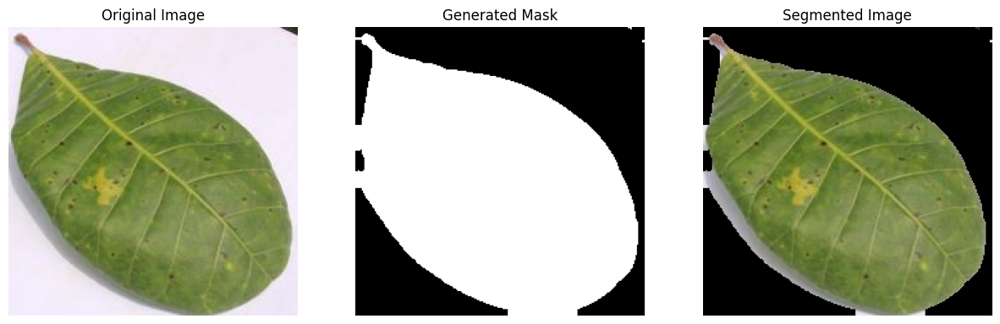

In [ ]:
def unet_image(image_path, model, image_size=(224, 224)):
    # Load the image
    image = cv2.imread(image_path)
    original_size = (image.shape[1], image.shape[0])

    # Preprocess the image
    resized_image = cv2.resize(image, image_size)
    input_image = resized_image / 255.0  # Normalize to [0, 1]
    input_image = np.expand_dims(input_image, axis=0)  # Add batch dimension

    # Generate mask
    predicted_mask = model.predict(input_image)[0]
    predicted_mask = cv2.resize(predicted_mask, original_size)  # Resize mask to original image size
    predicted_mask = (predicted_mask > 0.5).astype(np.uint8)  # Binarize mask

    # Segment the image by applying the mask
    segmented_image = cv2.bitwise_and(image, image, mask=predicted_mask.squeeze())

    return image, predicted_mask, segmented_image

# Example usage
image_path = '/content/CCMT_crop_diseases/Cashew_anthracnose/anthracnose1657_.jpg'  # R5place with your image path
original_image, mask, segmented_image = unet_image(image_path, model_unet)

# Visualize the results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask.squeeze(), cmap='gray')
plt.title("Generated Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title("Segmented Image")
plt.axis("off")

plt.show()

### **Using Deeplabv3+**

In [ ]:
def deeplv3_model(input_size=(224, 224, 3)):
    base_model = tf.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=input_size)

    # ASPP
    x = base_model.output
    x = layers.Conv2D(256, (1, 1), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Decoder - Upsample to match the input size
    x = layers.UpSampling2D(size=(4, 4))(x)  # Upsample to (28, 28)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.UpSampling2D(size=(4, 4))(x)  # Further upsample to (112, 112)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.UpSampling2D(size=(2, 2))(x)  # Final upsample to (224, 224)
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Final output layer
    x = layers.Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = models.Model(inputs=base_model.input, outputs=x)

    return model

# Compile and train the model as before
model_deeplv3 = deeplv3_model()
model_deeplv3.compile(optimizer='adam', loss=bce_dice_loss, metrics=['accuracy', iou])


In [ ]:
# Train DeepLabV3+
history_deeplv3 = model_deeplv3.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/30
498/498 [==============================] - 128s 207ms/step - loss: 0.2871 - accuracy: 0.8876 - iou: 0.8502 - val_loss: 0.2337 - val_accuracy: 0.9045 - val_iou: 0.8838 - lr: 0.0010
Epoch 2/30
498/498 [==============================] - 102s 205ms/step - loss: 0.1768 - accuracy: 0.9165 - iou: 0.9031 - val_loss: 0.1676 - val_accuracy: 0.9190 - val_iou: 0.9124 - lr: 0.0010
Epoch 3/30
498/498 [==============================] - 102s 205ms/step - loss: 0.1551 - accuracy: 0.9215 - iou: 0.9140 - val_loss: 0.1628 - val_accuracy: 0.9200 - val_iou: 0.9171 - lr: 0.0010
Epoch 4/30
498/498 [==============================] - 102s 205ms/step - loss: 0.1445 - accuracy: 0.9240 - iou: 0.9196 - val_loss: 0.1540 - val_accuracy: 0.9216 - val_iou: 0.9225 - lr: 0.0010
Epoch 5/30
498/498 [==============================] - 102s 205ms/step - loss: 0.1361 - accuracy: 0.9260 - iou: 0.9238 - val_loss: 0.1541 - val_accuracy: 0.9225 - val_iou: 0.9240 - lr: 0.0010
Epoch 6/30
498/498 [=========================

In [ ]:
test_loss_deeplv3, test_accuracy_deeplv3, test_iou_deeplv3 = model_deeplv3.evaluate(test_generator)


62/62 [==============================] - 5s 71ms/step - loss: 0.1236 - accuracy: 0.9285 - iou: 0.9320


In [ ]:
# Save the trained model to Google Drive
model_deeplv3.save('/content/drive/MyDrive/Dissertation/deeplv3_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### **Using LinkNet**

In [ ]:
# Define LinkNet model
def linknet_model(input_size=(224, 224, 3)):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_size)
    x = base_model.output

    # Decoder: link each encoder stage to the corresponding decoder stage
    def link_block(x, filters, strides=(2, 2)):
        x = layers.Conv2D(filters, (1, 1), padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.Conv2DTranspose(filters, (3, 3), strides=strides, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        return x

    # Decoder blocks corresponding to each ResNet stage
    x = link_block(x, 512)
    x = link_block(x, 256)
    x = link_block(x, 128)
    x = link_block(x, 64)

    # Final upsampling to match input size
    x = layers.UpSampling2D(size=(2, 2))(x)  # Upsample to 224x224

    # Final layer
    x = layers.Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = models.Model(inputs=base_model.input, outputs=x)
    return model


# Compile and train LinkNet
model_linknet = linknet_model()
model_linknet.compile(optimizer='adam', loss=bce_dice_loss, metrics=['accuracy', iou])

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
# Train LinkNet
history_linknet = model_linknet.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=30,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/30
498/498 [==============================] - 85s 92ms/step - loss: 0.2065 - accuracy: 0.9102 - iou: 0.8882 - val_loss: 7.1937 - val_accuracy: 0.3063 - val_iou: 2.2361e-04 - lr: 0.0010
Epoch 2/30
498/498 [==============================] - 44s 88ms/step - loss: 0.1412 - accuracy: 0.9253 - iou: 0.9237 - val_loss: 0.4006 - val_accuracy: 0.8671 - val_iou: 0.8462 - lr: 0.0010
Epoch 3/30
498/498 [==============================] - 44s 88ms/step - loss: 0.1222 - accuracy: 0.9295 - iou: 0.9335 - val_loss: 0.1614 - val_accuracy: 0.9241 - val_iou: 0.9350 - lr: 0.0010
Epoch 4/30
498/498 [==============================] - 44s 88ms/step - loss: 0.1126 - accuracy: 0.9317 - iou: 0.9384 - val_loss: 0.4253 - val_accuracy: 0.8681 - val_iou: 0.8524 - lr: 0.0010
Epoch 5/30
498/498 [==============================] - 45s 89ms/step - loss: 0.1027 - accuracy: 0.9340 - iou: 0.9436 - val_loss: 0.2045 - val_accuracy: 0.9153 - val_iou: 0.9192 - lr: 0.0010
Epoch 6/30
498/498 [==============================]

In [ ]:
test_loss_linknet, test_accuracy_linknet, test_iou_linknet = model_linknet.evaluate(test_generator)


62/62 [==============================] - 3s 51ms/step - loss: 0.0969 - accuracy: 0.9344 - iou: 0.9473


In [ ]:
# Save the trained model to Google Drive
model_linknet.save('/content/drive/MyDrive/Dissertation/linknet_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 1s 1s/step


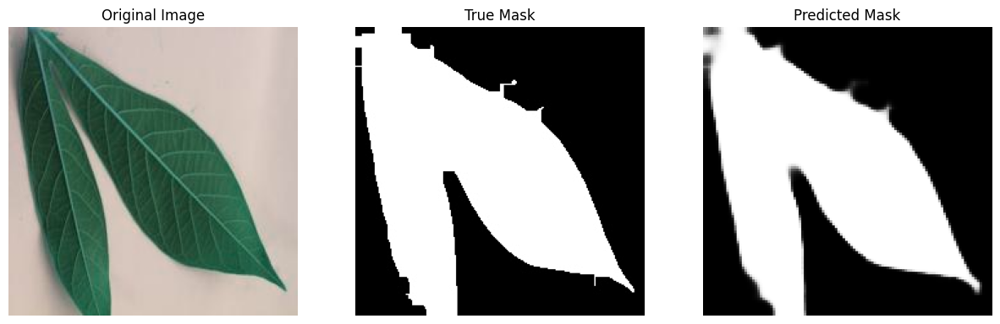

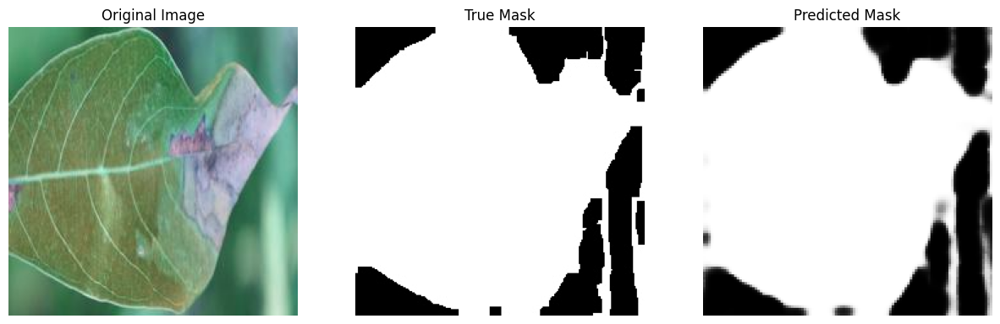

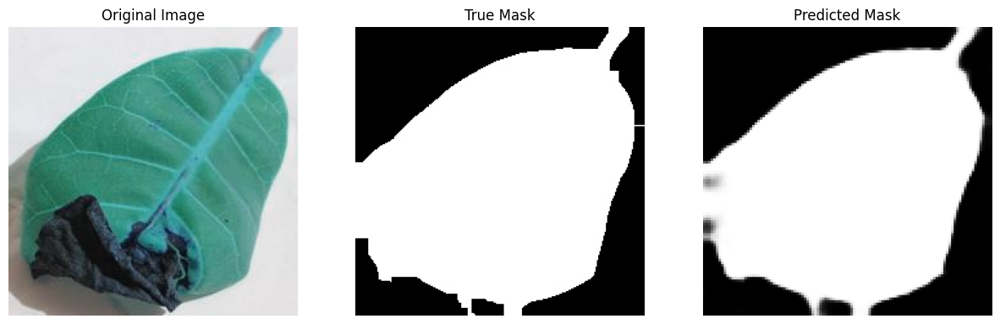

1/1 [==============================] - 0s 35ms/step


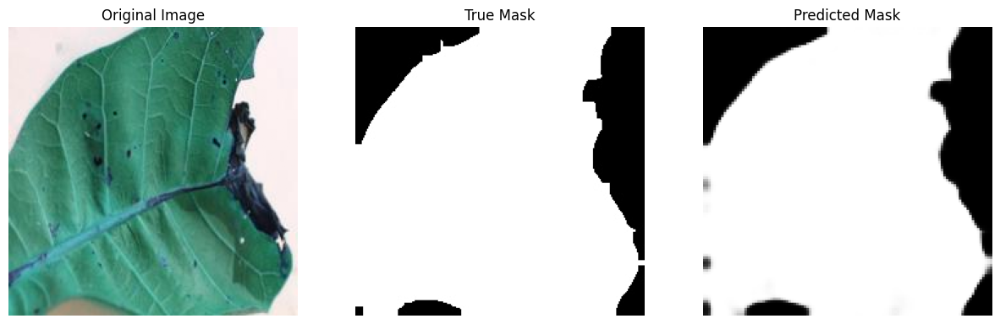

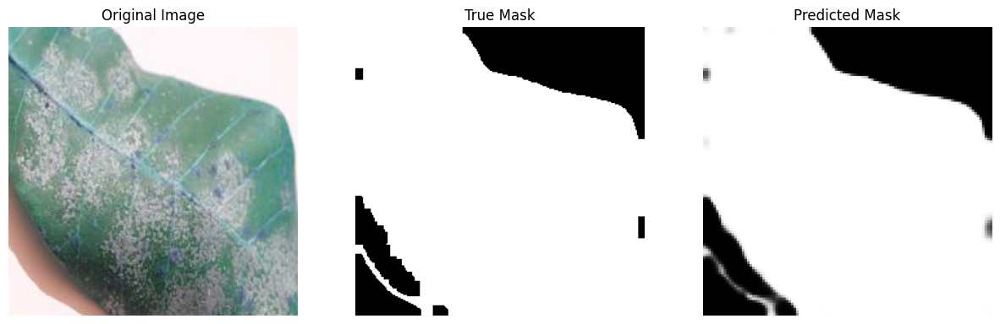

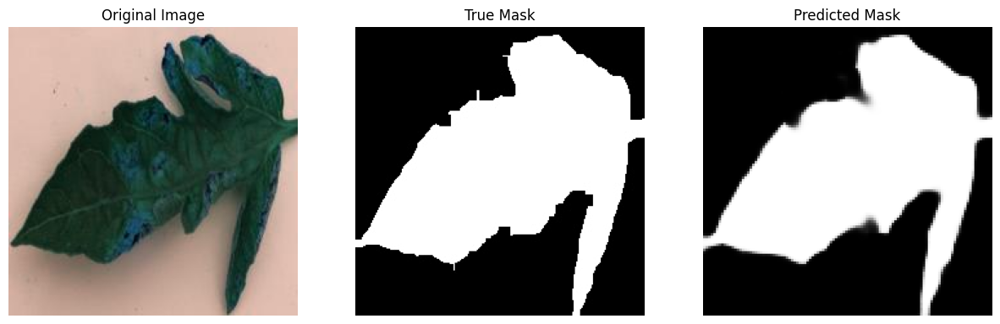

1/1 [==============================] - 0s 35ms/step


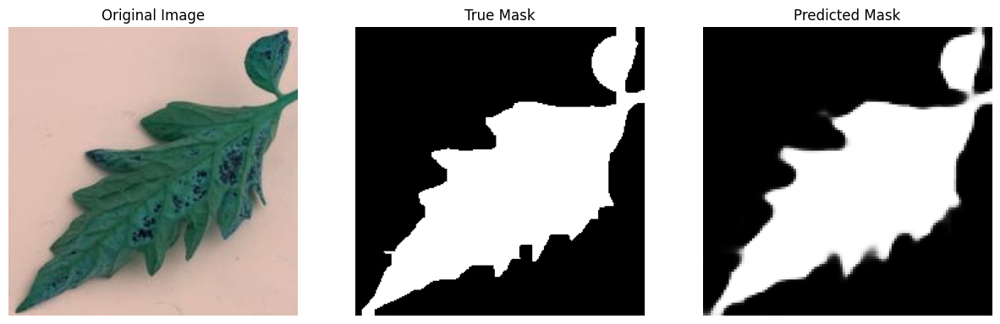

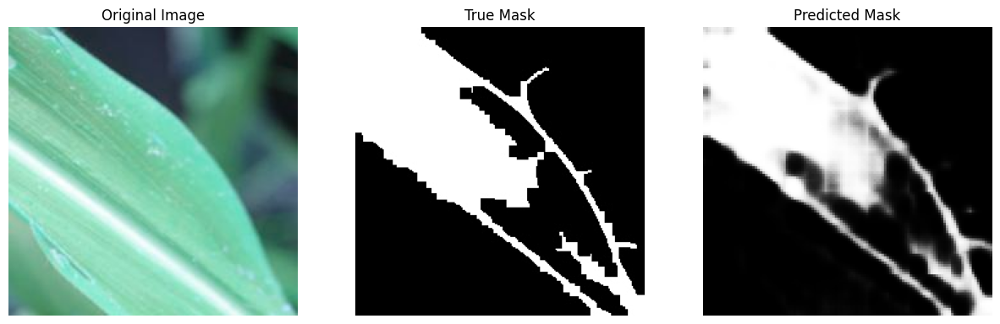

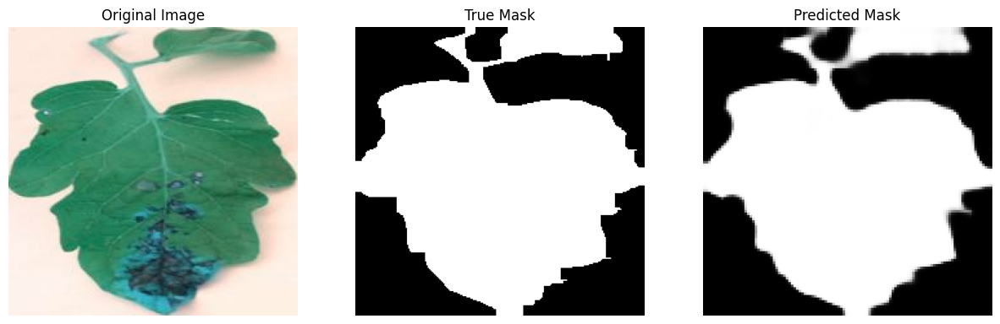

In [ ]:
# Function to display images and their corresponding masks and predictions
def display_predictions(generator, model, num_images=3):
    # Get random batch index
    batch_indices = random.sample(range(len(generator)), num_images)

    for idx in batch_indices:
        # Get a batch of images and masks
        images, masks = generator[idx]

        # Predict masks for the batch
        predictions = model.predict(images)

        for i in range(min(num_images, len(images))):
            plt.figure(figsize=(15, 5))

            # Original Image
            plt.subplot(1, 3, 1)
            plt.imshow(images[i])
            plt.title("Original Image")
            plt.axis("off")

            # True Mask
            plt.subplot(1, 3, 2)
            plt.imshow(masks[i].squeeze(), cmap='gray')
            plt.title("True Mask")
            plt.axis("off")

            # Predicted Mask
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i].squeeze(), cmap='gray')
            plt.title("Predicted Mask")
            plt.axis("off")

            plt.show()

# Visualize random results from the test set
display_predictions(test_generator, model_linknet, num_images=3)

Processing: /content/CCMT_crop_diseases/Tomato_healthy/healthy165_.jpg
1/1 [==============================] - 0s 25ms/step
Processing: /content/CCMT_crop_diseases/Cashew_red rust/red rust1630_.jpg
1/1 [==============================] - 0s 24ms/step
Processing: /content/CCMT_crop_diseases/Maize_leaf spot/leaf spot24_.jpg
1/1 [==============================] - 0s 24ms/step
Processing: /content/CCMT_crop_diseases/Cassava_mosaic/mosaic569_.jpg
1/1 [==============================] - 0s 23ms/step


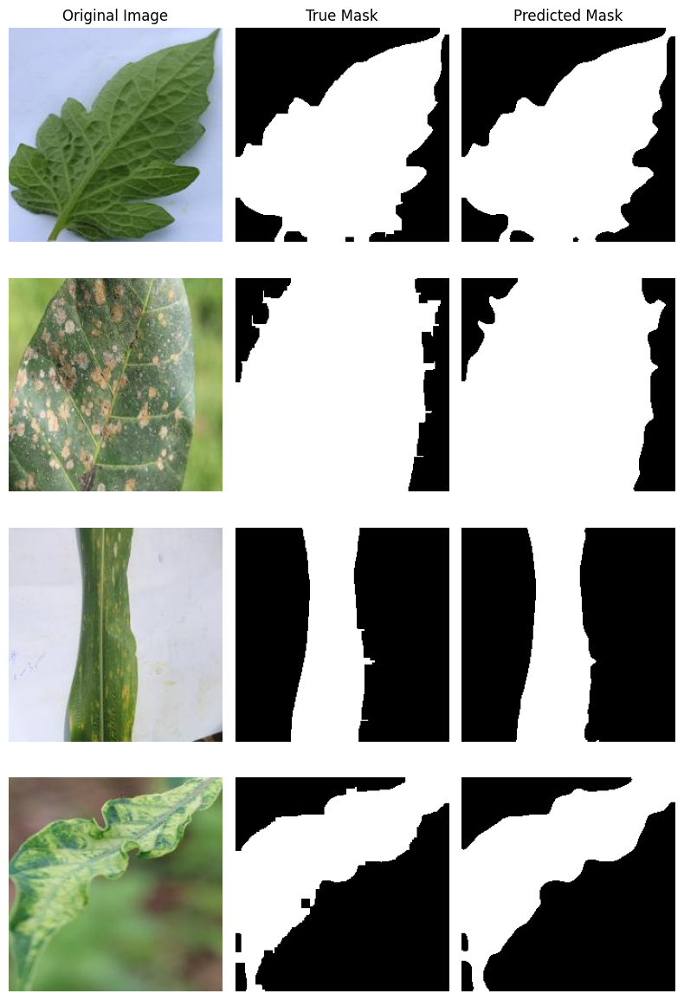

In [ ]:
def preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = img / 255.0  # Normalize the image to [0, 1] range
    img = np.expand_dims(img, axis=0)  # Add batch dimension
    return img

def load_true_mask(mask_path, target_size=(224, 224)):
    mask = load_img(mask_path, color_mode='grayscale', target_size=target_size)
    mask = img_to_array(mask)
    mask = mask / 255.0  # Normalize the mask to [0, 1] range
    return mask

# Paths to your sample images (replace with actual paths)
sample_images = [
    '/content/CCMT_crop_diseases/Tomato_healthy/healthy165_.jpg',
    '/content/CCMT_crop_diseases/Cashew_red rust/red rust1630_.jpg',
    '/content/CCMT_crop_diseases/Maize_leaf spot/leaf spot24_.jpg',
    '/content/CCMT_crop_diseases/Cassava_mosaic/mosaic569_.jpg'
]

# Corresponding true mask paths (replace with actual paths)
sample_masks = [
    '/content/CCMT_mask_diseases/Tomato_healthy/healthy165_.jpg',
    '/content/CCMT_mask_diseases/Cashew_red rust/red rust1630_.jpg',
    '/content/CCMT_mask_diseases/Maize_leaf spot/leaf spot24_.jpg',
    '/content/CCMT_mask_diseases/Cassava_mosaic/mosaic569_.jpg'
]

# Create a figure for displaying all images and masks in one plot
plt.figure(figsize=(8, 12))  # Adjust the height to fit all rows

# Loop over the sample images and display the results
for i, (image_path, mask_path) in enumerate(zip(sample_images, sample_masks)):
    print(f"Processing: {image_path}")

    # Preprocess the image
    img = preprocess_image(image_path)

    # Load the true mask
    true_mask = load_true_mask(mask_path)

    # Predict the mask using the trained model
    predicted_mask = model_segnet.predict(img)[0]

    # Binarize the predicted mask (thresholding)
    predicted_mask = (predicted_mask > 0.5).astype(np.uint8)

    # Plot the Original Image
    plt.subplot(len(sample_images), 3, i * 3 + 1)
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
    if i == 0:
        plt.title("Original Image")
    plt.axis("off")

    # Plot the True Mask
    plt.subplot(len(sample_images), 3, i * 3 + 2)
    plt.imshow(true_mask.squeeze(), cmap='gray')
    if i == 0:
        plt.title("True Mask")
    plt.axis("off")

    # Plot the Predicted Mask
    plt.subplot(len(sample_images), 3, i * 3 + 3)
    plt.imshow(predicted_mask.squeeze(), cmap='gray')
    if i == 0:
        plt.title("Predicted Mask")
    plt.axis("off")

# Adjust layout to prevent overlap and display the plot
plt.tight_layout()
plt.show()

### Comparing results

In [ ]:
# Compare results
all_results_seg = {
    "Model": ["SegNet", "UNet", "LinkNet", "deeplabV3plus"],
    "Test Loss": [test_loss_segnet, test_loss_unet, test_loss_linknet, test_loss_deeplv3],
    "Test Accuracy": [test_accuracy_segnet, test_accuracy_unet, test_accuracy_linknet, test_accuracy_deeplv3],
    "Test IoU": [test_iou_segnet, test_iou_unet, test_iou_linknet, test_iou_deeplv3]
}

# Create a DataFrame from the results dictionary
df_results_seg = pd.DataFrame(all_results_seg)
print(df_results_seg)

           Model  Test Loss  Test Accuracy  Test IoU
0         SegNet   0.087838       0.936898  0.952764
1           UNet   0.105181       0.931607  0.943565
2        LinkNet   0.096856       0.934370  0.947347
3  deeplabV3plus   0.123567       0.928497  0.931961


In [ ]:
# List of model histories and names
histories_seg = [history_segnet, history_unet, history_linknet, history_deeplv3]
model_names_seg = ["SegNet", "UNet", "LinkNet", "deeplabV3plus"]

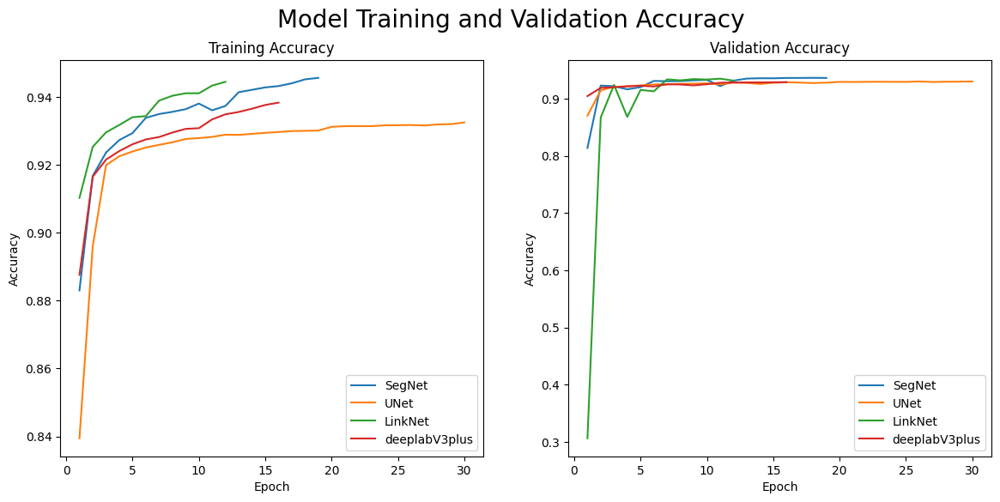

In [ ]:
def plot_model_accuracies(histories_seg, model_names_seg):
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    for history, model_name in zip(histories_seg, model_names_seg):
        epochs = range(1, len(history.history['accuracy']) + 1)
        plt.plot(epochs, history.history['accuracy'], label=f'{model_name}')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    for history, model_name in zip(histories_seg, model_names_seg):
        epochs = range(1, len(history.history['val_accuracy']) + 1)
        plt.plot(epochs, history.history['val_accuracy'], label=f'{model_name}')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.suptitle('Model Training and Validation Accuracy', size=20)
    plt.show()

# Call the function to plot
plot_model_accuracies(histories_seg, model_names_seg)

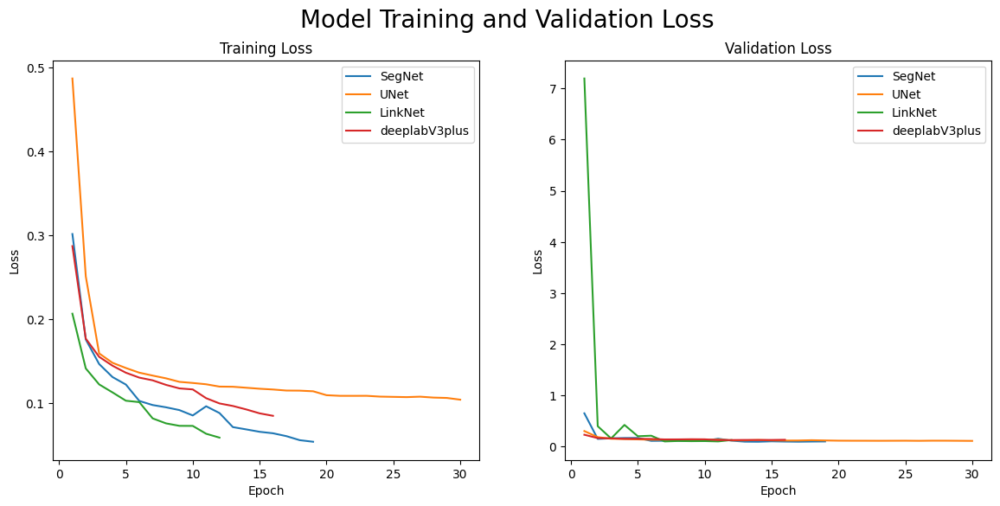

In [ ]:
def plot_model_losses(histories_seg, model_names_seg):
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    for history, model_name in zip(histories_seg, model_names_seg):
        epochs = range(1, len(history.history['loss']) + 1)
        plt.plot(epochs, history.history['loss'], label=f'{model_name}')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    for history, model_name in zip(histories_seg, model_names_seg):
        epochs = range(1, len(history.history['val_loss']) + 1)
        plt.plot(epochs, history.history['val_loss'], label=f'{model_name}')
    plt.title('Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.suptitle('Model Training and Validation Loss', size=20)
    plt.show()

# Call the function to plot
plot_model_losses(histories_seg, model_names_seg)

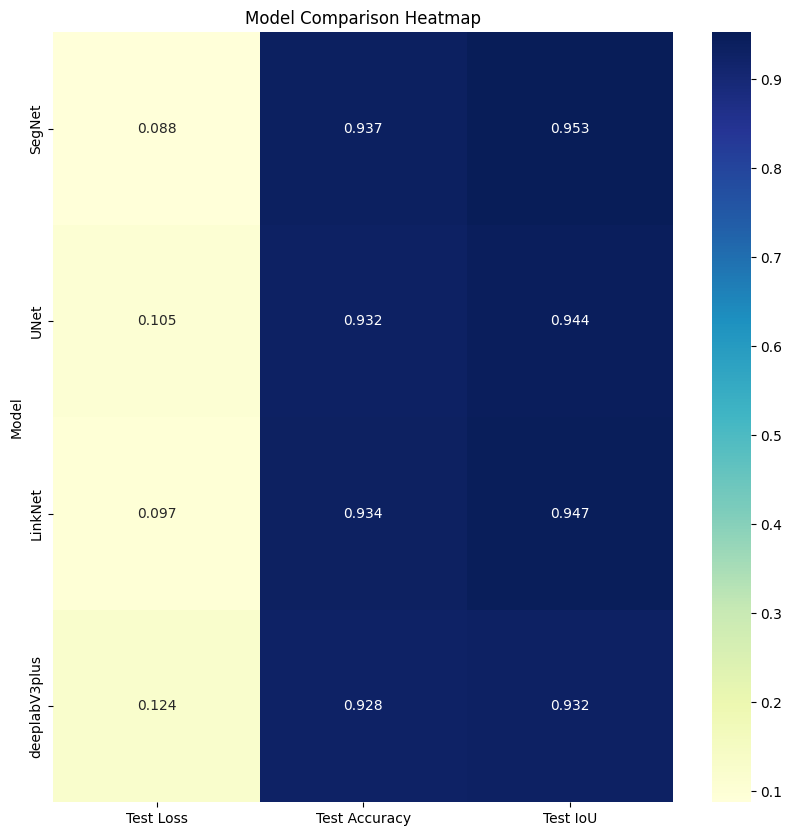

In [ ]:
# Melt the DataFrame for plotting
df_melted_seg = df_results_seg.melt(id_vars="Model", var_name="Metric", value_name="Value")

# Set the color palette to Paired
sns.set_palette("Paired")

# Create a pivot table for the heatmap
df_pivot_seg = df_results_seg.set_index('Model')

# Plot heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(df_pivot_seg, annot=True, cmap="YlGnBu", fmt=".3f")
plt.title('Model Comparison Heatmap')
plt.show()

# **Colour-based Segmentation**

In [ ]:
from tensorflow.keras.models import load_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


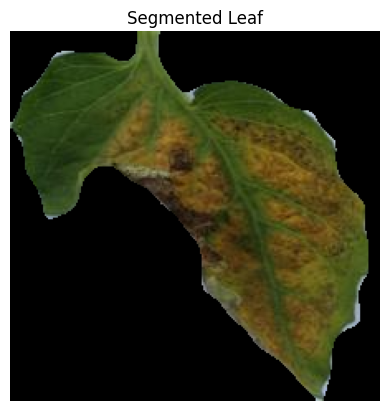

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the trained SegNet model
model_segnet = load_model('/content/drive/MyDrive/Dissertation/segnet_model_original.h5', custom_objects={'bce_dice_loss': bce_dice_loss, 'iou': iou})

# Load and preprocess the image
image_path = '/content/CCMT_crop_diseases/Tomato_septoria leaf spot/septoria leaf spot1629_.jpg'  # Replace with your actual image path
original_image = cv2.imread(image_path)
image_resized = cv2.resize(original_image, (224, 224))  # Resize the image to the input size of the model
image_normalized = image_resized / 255.0  # Normalize the image
image_input = np.expand_dims(image_normalized, axis=0)  # Add batch dimension

# Predict the leaf mask using the SegNet model
predicted_mask = model_segnet.predict(image_input)
predicted_mask = (predicted_mask > 0.5).astype(np.uint8)  # Binarize the mask
predicted_mask = np.squeeze(predicted_mask)  # Remove batch dimension

# Resize the mask to the original image size
mask_resized = cv2.resize(predicted_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

# Apply the mask to the original image
segmented_leaf = cv2.bitwise_and(original_image, original_image, mask=mask_resized)

# Save or visualize the segmented leaf
plt.imshow(cv2.cvtColor(segmented_leaf, cv2.COLOR_BGR2RGB))
plt.title("Segmented Leaf")
plt.axis('off')
plt.show()

# Save the segmented leaf for further processing in the next cell
cv2.imwrite('/content/segmented_leaf.png', segmented_leaf)


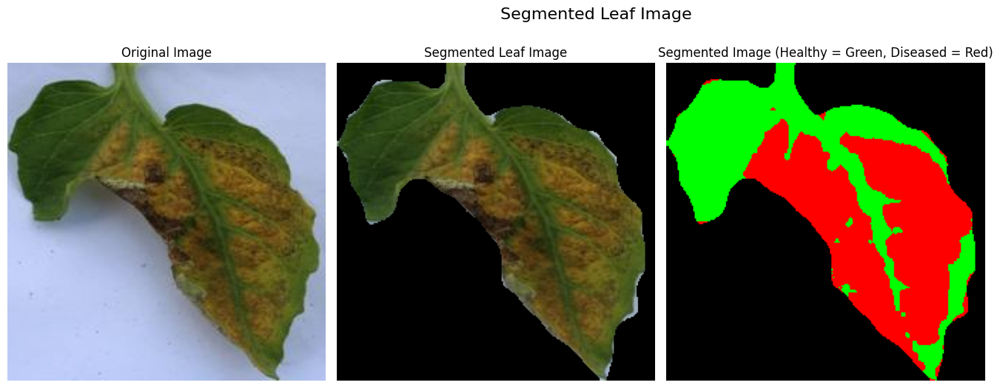

In [ ]:
# Function to segment healthy (green) parts using HSV color thresholding
def segment_healthy_vs_diseased(image):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define the HSV range for the color green (adjust these values if necessary)
    lower_green = np.array([35, 30, 30])
    upper_green = np.array([85, 255, 255])

    # Create a mask for the green areas (healthy parts)
    healthy_mask = cv2.inRange(hsv, lower_green, upper_green)

    # Create a mask for the leaf (exclude background)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, leaf_mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

    # Invert the healthy mask to get diseased areas
    diseased_mask = cv2.bitwise_and(leaf_mask, cv2.bitwise_not(healthy_mask))

    # Initialize a blank image for output
    output_image = np.zeros_like(image)

    # Color healthy areas green and diseased areas red
    output_image[healthy_mask > 0] = [0, 255, 0]  # Green for healthy
    output_image[diseased_mask > 0] = [0, 0, 255]  # Red for diseased

    return output_image, leaf_mask, diseased_mask

# Segment and visualize the healthy and diseased parts
segmented_healthy_diseased_image, leaf_mask, diseased_mask = segment_healthy_vs_diseased(segmented_leaf)

# Visualize the original image, segmented leaf, and healthy vs diseased segmentation
plt.figure(figsize=(18, 6))

# Original Leaf Image
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

# Segmented Leaf Image
plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(segmented_leaf, cv2.COLOR_BGR2RGB))
plt.title("Segmented Leaf Image")
plt.axis('off')

# Segmented Image (Healthy vs. Diseased)
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(segmented_healthy_diseased_image, cv2.COLOR_BGR2RGB))
plt.title("Segmented Image (Healthy = Green, Diseased = Red)")
plt.axis('off')

# Adjust layout to prevent overlap and display the plot
plt.suptitle("Segmented Leaf Image", fontsize=16)
plt.tight_layout(rect=[0.05, 0.1, 0.8, 0.95])  # Adjust layout to make room for the suptitle
plt.show()

IoU Score for Diseased Regions: 0.8359


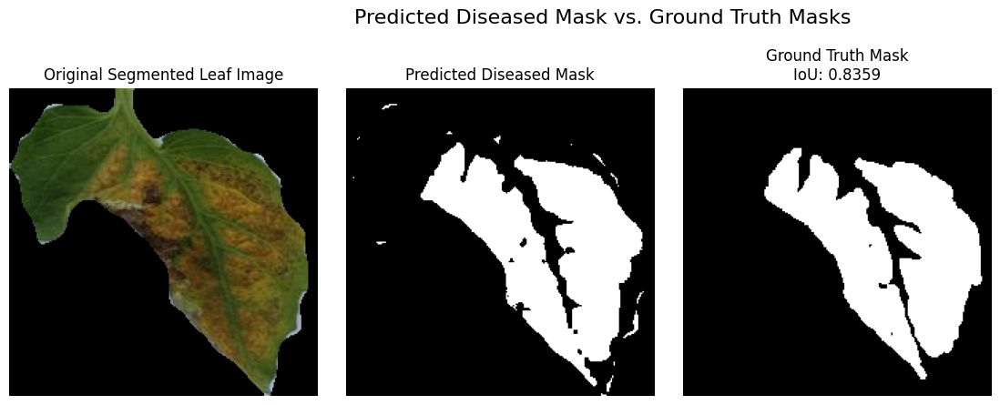

In [ ]:
# Function to calculate IoU
def calculate_iou(pred_mask, true_mask):
    intersection = np.logical_and(pred_mask, true_mask)
    union = np.logical_or(pred_mask, true_mask)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

# Load the ground truth mask for the diseased regions
ground_truth_mask_path = '/content/drive/MyDrive/Dissertation/Few_disease_annot_mask/septoria leaf spot1629_.png'  # Replace with the actual path
ground_truth_mask = cv2.imread(ground_truth_mask_path, cv2.IMREAD_GRAYSCALE)

# Resize the ground truth mask to match the original image size
ground_truth_mask = cv2.resize(ground_truth_mask, (diseased_mask.shape[1], diseased_mask.shape[0]), interpolation=cv2.INTER_NEAREST)

# Calculate IoU between the predicted diseased mask and the ground truth mask
iou_score = calculate_iou(diseased_mask > 0, ground_truth_mask > 0)
print(f"IoU Score for Diseased Regions: {iou_score:.4f}")

# Visualize the original image, predicted disease mask, and ground truth mask
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(segmented_leaf, cv2.COLOR_BGR2RGB))
plt.title("Original Segmented Leaf Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(diseased_mask, cmap='gray')
plt.title("Predicted Diseased Mask")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(ground_truth_mask, cmap='gray')
plt.title(f"Ground Truth Mask\nIoU: {iou_score:.4f}")
plt.axis("off")

# Add a title for the entire plot
plt.suptitle('Predicted Diseased Mask vs. Ground Truth Masks', fontsize=16)
plt.tight_layout(rect=[0.05, 0.1, 0.8, 0.95])  # Adjust layout to make room for the suptitle
plt.show()


# **Severity Estimation**

In [ ]:
# Function to calculate the Percentage of Disease Severity (PDS)
def calculate_pds(leaf_mask, diseased_mask):
    total_leaf_area = np.sum(leaf_mask > 0)
    diseased_area = np.sum(diseased_mask > 0)

    if total_leaf_area == 0:
        return 0.0  # To avoid division by zero

    pds = (diseased_area / total_leaf_area) * 100
    return pds

# Function to classify the severity based on PDS
def classify_severity(pds):
    if pds == 0:
        return "Normal"
    elif 0 < pds < 20:
        return "Mild"
    elif 20 <= pds < 30:
        return "Moderate"
    elif 30 <= pds < 50:
        return "Severe"
    elif pds >= 50:
        return "Critical"

# Calculate the Percentage of Disease Severity (PDS)
pds = calculate_pds(leaf_mask, diseased_mask)

# Classify the severity based on the calculated PDS
severity_classification = classify_severity(pds)

# Display the results
print(f"Percentage of Disease Severity (PDS): {pds:.2f}%")
print(f"Severity Classification: {severity_classification}")

Percentage of Disease Severity (PDS): 55.75%
Severity Classification: Critical


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


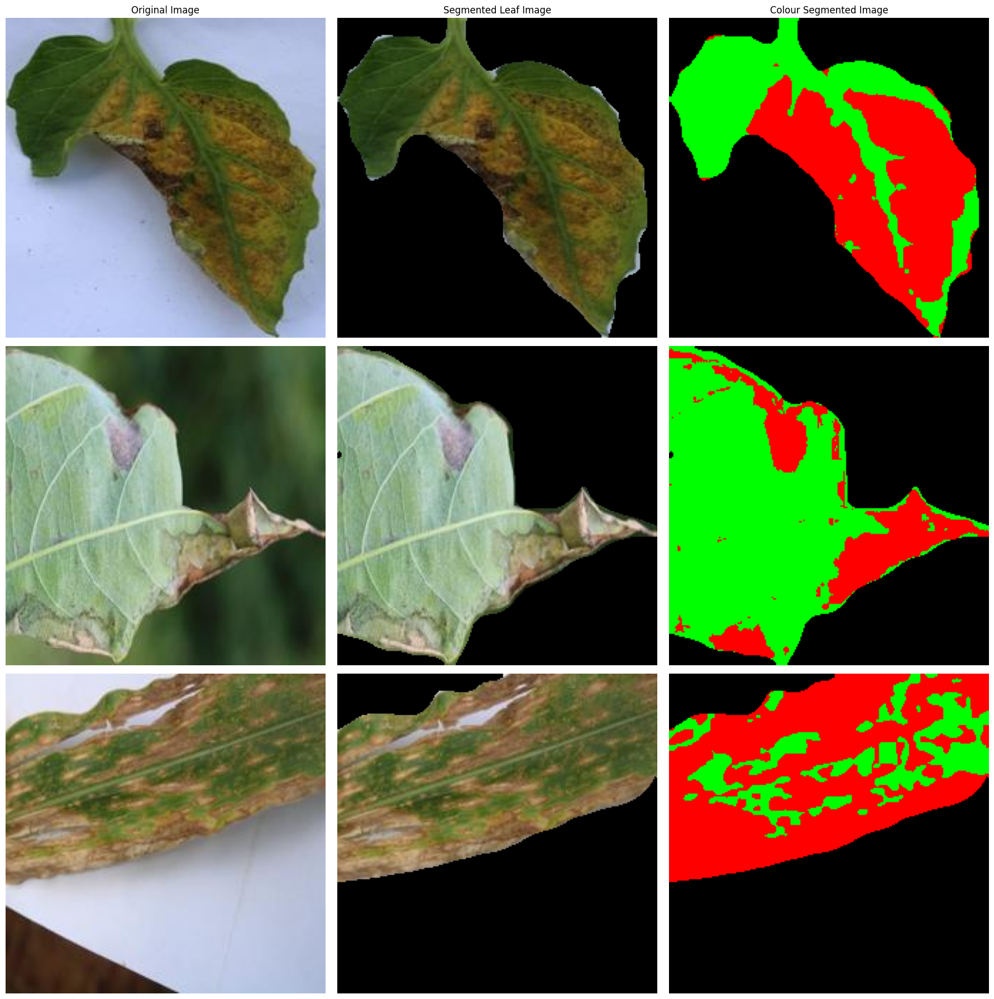

In [ ]:
# Load the trained SegNet model
model_segnet = load_model('/content/drive/MyDrive/Dissertation/segnet_model_original.h5', custom_objects={'bce_dice_loss': bce_dice_loss, 'iou': iou})

# Paths to the leaf images
leaf_images = [
    '/content/CCMT_crop_diseases/Tomato_septoria leaf spot/septoria leaf spot1629_.jpg',
    '/content/CCMT_crop_diseases/Cassava_bacterial blight/bacterial blight1693_.jpg',
    '/content/CCMT_crop_diseases/Maize_leaf blight/leaf blight213_.jpg',
]

# Store results in a DataFrame
results = []

# Calculate the number of rows needed (one row per image)
num_rows = len(leaf_images)

# Create a figure for displaying all images in one plot
plt.figure(figsize=(18, num_rows * 6))  # Adjust the height to fit all rows

# Display and analyze each image
for i, image_path in enumerate(leaf_images):
    # Load and preprocess the image
    original_image = cv2.imread(image_path)
    image_resized = cv2.resize(original_image, (224, 224))  # Resize the image to the input size of the model
    image_normalized = image_resized / 255.0  # Normalize the image
    image_input = np.expand_dims(image_normalized, axis=0)  # Add batch dimension

    # Predict the leaf mask using the SegNet model
    predicted_mask = model_segnet.predict(image_input)
    predicted_mask = (predicted_mask > 0.5).astype(np.uint8)  # Binarize the mask
    predicted_mask = np.squeeze(predicted_mask)  # Remove batch dimension

    # Resize the mask to the original image size
    mask_resized = cv2.resize(predicted_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Apply the mask to the original image
    segmented_leaf = cv2.bitwise_and(original_image, original_image, mask=mask_resized)

    # Segment healthy vs diseased regions
    segmented_healthy_diseased_image, leaf_mask, diseased_mask = segment_healthy_vs_diseased(segmented_leaf)

    # Calculate the Percentage of Disease Severity (PDS)
    pds = calculate_pds(leaf_mask, diseased_mask)

    # Classify the severity based on the calculated PDS
    severity_classification = classify_severity(pds)

    # Save the results in the DataFrame
    results.append({
        "Leaf Image": f"Leaf {i + 1}",
        "PDS (%)": f"{pds:.2f}",
        "Severity Classification": severity_classification
    })

    # Display the images in a single plot
    plt.subplot(num_rows, 3, i * 3 + 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    if i == 0:
        plt.title("Original Image")
    plt.axis('off')

    plt.subplot(num_rows, 3, i * 3 + 2)
    plt.imshow(cv2.cvtColor(segmented_leaf, cv2.COLOR_BGR2RGB))
    if i == 0:
        plt.title("Segmented Leaf Image")
    plt.axis('off')

    plt.subplot(num_rows, 3, i * 3 + 3)
    plt.imshow(cv2.cvtColor(segmented_healthy_diseased_image, cv2.COLOR_BGR2RGB))
    if i == 0:
        plt.title("Colour Segmented Image")
    plt.axis('off')

# Adjust layout to prevent overlap and display the plot
# Add a title for the entire plot
plt.tight_layout()
plt.show()

In [ ]:
# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Display the results as a table
print("\nDisease Severity Analysis")
print(results_df.to_string(index=False))


Disease Severity Analysis
Leaf Image PDS (%) Severity Classification
    Leaf 1   55.75                Critical
    Leaf 2   22.22                Moderate
    Leaf 3   74.97                Critical
